# **Load**

In [ ]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
import random
import string
import os
from tqdm import tqdm

In [ ]:
!pip install lpips

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

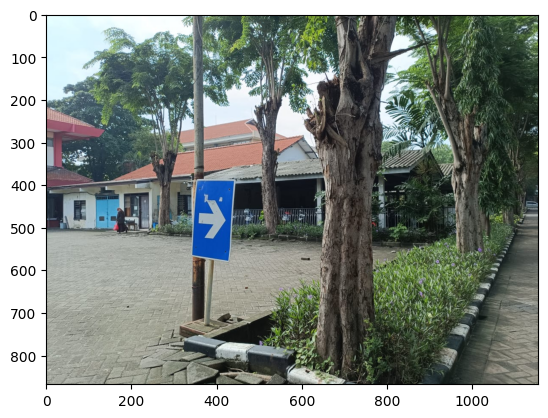

In [ ]:
E2 = np.array(Image.open("/content/E2 nih boss.png"))
plt.imshow(E2)

In [ ]:
E2 = E2.shape
E2

(868, 1156, 3)

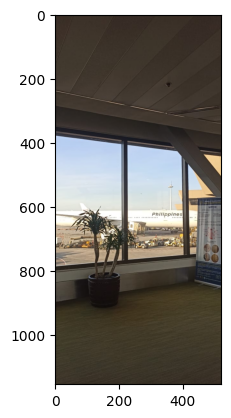

In [ ]:
Pesawat = np.array(Image.open("/content/cihuyy liburan.png"))
plt.imshow(Pesawat)

In [ ]:
Pesawat = Pesawat.shape
Pesawat

(1156, 520, 3)

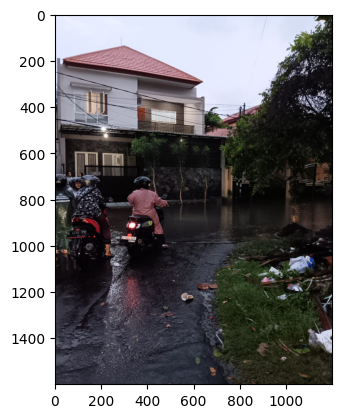

In [ ]:
Hujan = np.array(Image.open("/content/rintik sendu.png"))
plt.imshow(Hujan)

In [ ]:
Hujan = Hujan.shape
Hujan

(1600, 1200, 3)

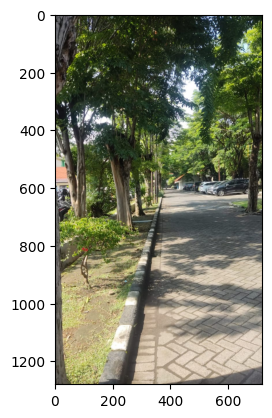

In [ ]:
Jalan = np.array(Image.open("/content/sepanjang jalan kenangan.png"))
plt.imshow(Jalan)

In [ ]:
Jalan = Jalan.shape
Jalan

(1280, 719, 3)

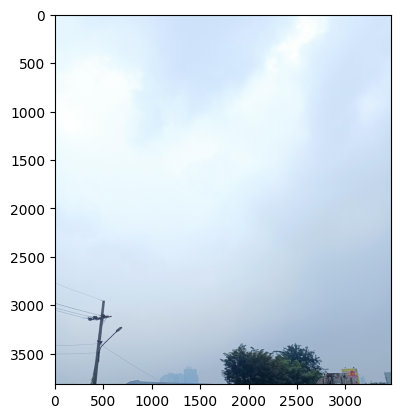

In [ ]:
Langit = np.array(Image.open("/content/langit hampa.png"))
plt.imshow(Langit)

In [ ]:
Langit = Langit.shape
Langit

(3818, 3472, 3)

# **Pre-Processing**

## Analisis Enhanced LSB

Keberhasilan metode ini didukung atas tingginya
kontras gambar yang dipakai. Apabila steganalisis
dilakukan dengan menggunakan gambar yang
memiliki warna latar yang jelas atau memiliki kontras
yang tinggi antara latar dengan gambar utama, maka steganalis dapat memprediksi
seperti apa gambar enhanced LSB yang seharusnya.
Sedangkan untuk gambar yang nilai kontrasnya
rendah, seperti gambar fotografis, teknik steganalisis dengan cara ini akan menyulitkan steganalis. Karena steganalis akan kesulitan
membedakan antara gambar yang seharusnya muncul
dengan pesan rahasia.

[Referensi](https://informatika.stei.itb.ac.id/~rinaldi.munir/TA/Makalah_TA%20Yulie%20Anneria.pdf)

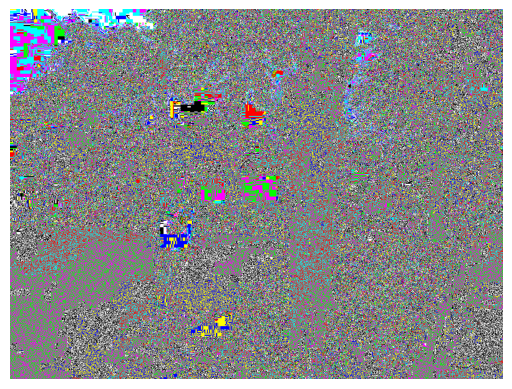

In [ ]:
E2 = np.array(Image.open("/content/E2 nih boss.png"))
lsb_E2 = E2 & 1  # Operasi bitwise AND langsung pada array
plt.imshow(lsb_E2 * 255)
plt.axis('off')
plt.show()


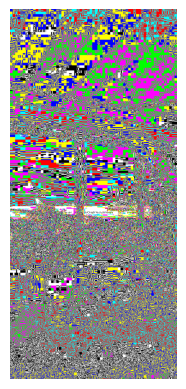

In [ ]:
Pesawat = np.array(Image.open("/content/cihuyy liburan.png"))
lsb_Pesawat = Pesawat & 1  # Operasi bitwise AND langsung pada array
plt.imshow(lsb_Pesawat * 255)
plt.axis('off')
plt.show()

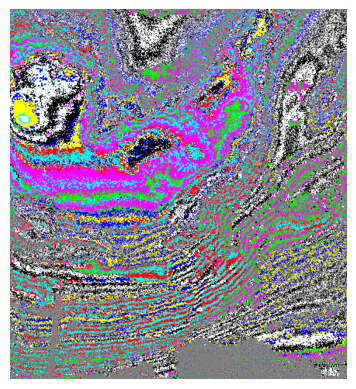

In [ ]:
Langit = np.array(Image.open("/content/langit hampa.png"))
lsb_Langit = Langit & 1
plt.imshow(lsb_Langit * 255)
plt.axis('off')
plt.show()

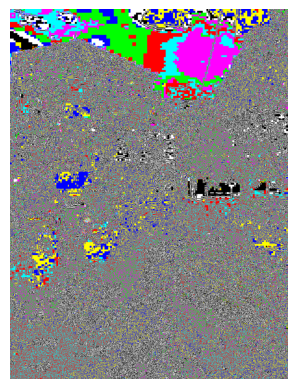

In [ ]:
Hujan = np.array(Image.open("/content/rintik sendu.png"))
lsb_Hujan = Hujan & 1
plt.imshow(lsb_Hujan * 255)
plt.axis('off')
plt.show()

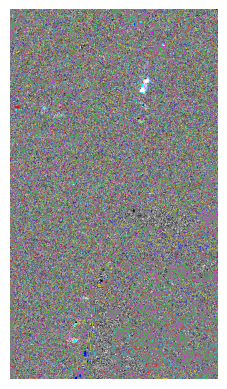

In [ ]:
Jalan = np.array(Image.open("/content/sepanjang jalan kenangan.png"))
lsb_Jalan = Jalan & 1
plt.imshow(lsb_Jalan * 255)
plt.axis('off')
plt.show()

## Mengecek apakah ada pesan tersembunyi

In [ ]:
!pip install stegano


In [ ]:
from stegano import lsb

try:
    pesan_tersembunyi = lsb.reveal(E2)
    if pesan_tersembunyi and pesan_tersembunyi.strip():
        print("Pesan tersembunyi terdeteksi:")
        print(pesan_tersembunyi)
    else:
        print("Tidak ditemukan pesan tersembunyi.")
except Exception as e:
    print("Tidak ditemukan pesan tersembunyi")

Tidak ditemukan pesan tersembunyi


In [ ]:
try:
    pesan_tersembunyi = lsb.reveal(Pesawat)
    if pesan_tersembunyi and pesan_tersembunyi.strip():
        print("Pesan tersembunyi terdeteksi:")
        print(pesan_tersembunyi)
    else:
        print("Tidak ditemukan pesan tersembunyi.")
except Exception as e:
    print("Tidak ditemukan pesan tersembunyi")

Tidak ditemukan pesan tersembunyi


In [ ]:
try:
    pesan_tersembunyi = lsb.reveal(Langit)
    if pesan_tersembunyi and pesan_tersembunyi.strip():
        print("Pesan tersembunyi terdeteksi:")
        print(pesan_tersembunyi)
    else:
        print("Tidak ditemukan pesan tersembunyi.")
except Exception as e:
    print("Tidak ditemukan pesan tersembunyi")

Tidak ditemukan pesan tersembunyi


In [ ]:
try:
    pesan_tersembunyi = lsb.reveal(Hujan)
    if pesan_tersembunyi and pesan_tersembunyi.strip():
        print("Pesan tersembunyi terdeteksi:")
        print(pesan_tersembunyi)
    else:
        print("Tidak ditemukan pesan tersembunyi.")
except Exception as e:
    print("Tidak ditemukan pesan tersembunyi")

Tidak ditemukan pesan tersembunyi


In [ ]:
try:
    pesan_tersembunyi = lsb.reveal(Jalan)
    if pesan_tersembunyi and pesan_tersembunyi.strip():
        print("Pesan tersembunyi terdeteksi:")
        print(pesan_tersembunyi)
    else:
        print("Tidak ditemukan pesan tersembunyi.")
except Exception as e:
    print("Tidak ditemukan pesan tersembunyi")

Tidak ditemukan pesan tersembunyi


# **Metode**

## Stegano LSB

In [ ]:
import requests
from PIL import Image
import numpy as np
import io

def message_to_binary(message):
    return ''.join([format(ord(i), '08b') for i in message])

def encode_image(image_path, messages, output_path="encoded_E2.png"):
    image = Image.open(image_path).convert("RGB")
    np_image = np.array(image)

    combined_message = '|'.join(messages) + "#####"
    binary_message = message_to_binary(combined_message)

    binary_index = 0
    data_len = len(binary_message)

    for i in range(np_image.shape[0]):
        for j in range(np_image.shape[1]):
            for k in range(3):  # RGB
                if binary_index < data_len:
                    pixel = np_image[i, j, k]
                    pixel_bin = format(pixel, '08b')
                    new_pixel_bin = pixel_bin[:-1] + binary_message[binary_index]
                    np_image[i, j, k] = int(new_pixel_bin, 2)
                    binary_index += 1
        if binary_index >= data_len:
            break

    encoded_image = Image.fromarray(np_image)
    encoded_image.save(output_path)
    print(f"Pesan berhasil disisipkan. Gambar disimpan di: {output_path}")
    return image, encoded_image


image_path = "/content/E2 nih boss.png"

pesan_pengguna = input("Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): ")
pesan_list = [msg.strip() for msg in pesan_pengguna.split(",")]

original_img, encoded_img = encode_image(image_path, pesan_list)

Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan, E2,  UNIVERSITAS NEGERI SURABAYA
Pesan berhasil disisipkan. Gambar disimpan di: encoded_E2.png


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 156MB/s]


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Pesan tersembunyi: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0002
PSNR: 86.09 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


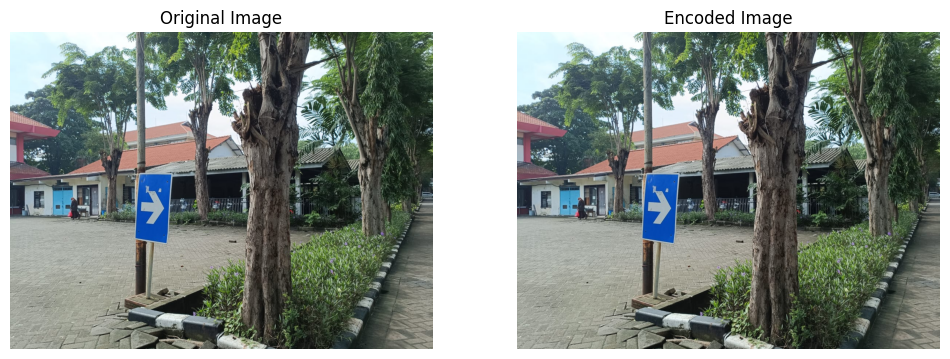

In [ ]:
import cv2
import torch
import lpips
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr_score, mean_squared_error as mse_score

def binary_to_string(binary_data):
    chars = [binary_data[i:i + 8] for i in range(0, len(binary_data), 8)]
    decoded = ''.join([chr(int(char, 2)) for char in chars])
    return decoded.split("#####")[0]

def decode_and_evaluate(original_image, encoded_image_path):
    encoded_image = Image.open(encoded_image_path).convert("RGB")
    np_encoded = np.array(encoded_image)

    binary_data = ""
    for i in range(np_encoded.shape[0]):
        for j in range(np_encoded.shape[1]):
            for k in range(3):  # RGB
                pixel_bin = format(np_encoded[i, j, k], '08b')
                binary_data += pixel_bin[-1]

    hidden_message = binary_to_string(binary_data)

    # Konversi ke format OpenCV (BGR) untuk beberapa metrik
    original_cv = np.array(original_image)
    encoded_cv = np.array(encoded_image)

    mse = mse_score(original_cv, encoded_cv)
    psnrlsb_E2 = psnr_score(original_cv, encoded_cv)
    embedded_bits = len(binary_data)
    height, width, channels = original_cv.shape
    capacity = embedded_bits / (height * width * channels)  # per channel-pixel
    bpp = embedded_bits / (height * width)                  # bits per pixel

    loss_fn = lpips.LPIPS(net='alex')
    o_tensor = torch.tensor(np.array(original_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    e_tensor = torch.tensor(np.array(encoded_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    lpips_val = loss_fn(o_tensor, e_tensor).item()

    nc = np.corrcoef(original_cv.flatten(), encoded_cv.flatten())[0, 1]

    print("Pesan tersembunyi:", hidden_message)
    print(f"Capacity: {capacity}")
    print(f"MSE: {mse:.4f}")
    print(f"PSNR: {psnrlsb_E2:.2f} dB")
    print(f"NC: {nc:.4f}")
    print(f"LPIPS: {lpips_val:.4f}")
    print(f"BPP: {bpp} bits/pixel")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(encoded_image)
    axes[1].set_title("Encoded Image")
    axes[1].axis('off')

    plt.show()

decode_and_evaluate(original_img, "encoded_E2.png")

In [ ]:
import requests
from PIL import Image
import numpy as np
import io

def message_to_binary(message):
    return ''.join([format(ord(i), '08b') for i in message])

def encode_image(image_path, messages, output_path="encoded_Pesawat.png"):
    image = Image.open(image_path).convert("RGB")
    np_image = np.array(image)

    combined_message = '|'.join(messages) + "#####"
    binary_message = message_to_binary(combined_message)

    binary_index = 0
    data_len = len(binary_message)

    for i in range(np_image.shape[0]):
        for j in range(np_image.shape[1]):
            for k in range(3):  # RGB
                if binary_index < data_len:
                    pixel = np_image[i, j, k]
                    pixel_bin = format(pixel, '08b')
                    new_pixel_bin = pixel_bin[:-1] + binary_message[binary_index]
                    np_image[i, j, k] = int(new_pixel_bin, 2)
                    binary_index += 1
        if binary_index >= data_len:
            break

    encoded_image = Image.fromarray(np_image)
    encoded_image.save(output_path)
    print(f"Pesan berhasil disisipkan. Gambar disimpan di: {output_path}")
    return image, encoded_image


image_path = "/content/cihuyy liburan.png"

pesan_pengguna = input("Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): ")
pesan_list = [msg.strip() for msg in pesan_pengguna.split(",")]

original_img, encoded_img = encode_image(image_path, pesan_list)

Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan, E2,  UNIVERSITAS NEGERI SURABAYA
Pesan berhasil disisipkan. Gambar disimpan di: encoded_Pesawat.png


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Pesan tersembunyi: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0002
PSNR: 84.34 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


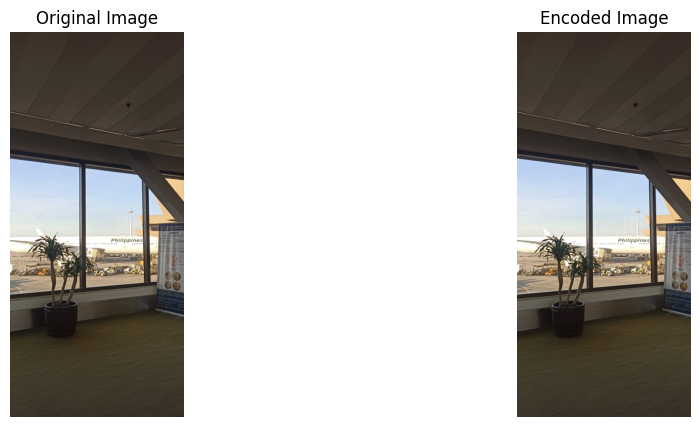

In [ ]:
import cv2
import torch
import lpips
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr_score, mean_squared_error as mse_score

def binary_to_string(binary_data):
    chars = [binary_data[i:i + 8] for i in range(0, len(binary_data), 8)]
    decoded = ''.join([chr(int(char, 2)) for char in chars])
    return decoded.split("#####")[0]

def decode_and_evaluate(original_image, encoded_image_path):
    encoded_image = Image.open(encoded_image_path).convert("RGB")
    np_encoded = np.array(encoded_image)

    binary_data = ""
    for i in range(np_encoded.shape[0]):
        for j in range(np_encoded.shape[1]):
            for k in range(3):  # RGB
                pixel_bin = format(np_encoded[i, j, k], '08b')
                binary_data += pixel_bin[-1]

    hidden_message = binary_to_string(binary_data)

    # Konversi ke format OpenCV (BGR) untuk beberapa metrik
    original_cv = np.array(original_image)
    encoded_cv = np.array(encoded_image)

    mse = mse_score(original_cv, encoded_cv)
    psnrlsb_pesawat = psnr_score(original_cv, encoded_cv)
    embedded_bits = len(binary_data)
    height, width, channels = original_cv.shape
    capacity = embedded_bits / (height * width * channels)  # per channel-pixel
    bpp = embedded_bits / (height * width)                  # bits per pixel

    loss_fn = lpips.LPIPS(net='alex')
    o_tensor = torch.tensor(np.array(original_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    e_tensor = torch.tensor(np.array(encoded_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    lpips_val = loss_fn(o_tensor, e_tensor).item()

    nc = np.corrcoef(original_cv.flatten(), encoded_cv.flatten())[0, 1]

    print("Pesan tersembunyi:", hidden_message)
    print(f"Capacity: {capacity}")
    print(f"MSE: {mse:.4f}")
    print(f"PSNR: {psnrlsb_pesawat:.2f} dB")
    print(f"NC: {nc:.4f}")
    print(f"LPIPS: {lpips_val:.4f}")
    print(f"BPP: {bpp} bits/pixel")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(encoded_image)
    axes[1].set_title("Encoded Image")
    axes[1].axis('off')

    plt.show()

decode_and_evaluate(original_img, "encoded_Pesawat.png")

In [ ]:
import requests
from PIL import Image
import numpy as np
import io

def message_to_binary(message):
    return ''.join([format(ord(i), '08b') for i in message])

def encode_image(image_path, messages, output_path="encoded_Hujan.png"):
    image = Image.open(image_path).convert("RGB")
    np_image = np.array(image)

    combined_message = '|'.join(messages) + "#####"
    binary_message = message_to_binary(combined_message)

    binary_index = 0
    data_len = len(binary_message)

    for i in range(np_image.shape[0]):
        for j in range(np_image.shape[1]):
            for k in range(3):  # RGB
                if binary_index < data_len:
                    pixel = np_image[i, j, k]
                    pixel_bin = format(pixel, '08b')
                    new_pixel_bin = pixel_bin[:-1] + binary_message[binary_index]
                    np_image[i, j, k] = int(new_pixel_bin, 2)
                    binary_index += 1
        if binary_index >= data_len:
            break

    encoded_image = Image.fromarray(np_image)
    encoded_image.save(output_path)
    print(f"Pesan berhasil disisipkan. Gambar disimpan di: {output_path}")
    return image, encoded_image


image_path = "/content/rintik sendu.png"

pesan_pengguna = input("Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): ")
pesan_list = [msg.strip() for msg in pesan_pengguna.split(",")]

original_img, encoded_img = encode_image(image_path, pesan_list)

Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan, E2,  UNIVERSITAS NEGERI SURABAYA
Pesan berhasil disisipkan. Gambar disimpan di: encoded_Hujan.png


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Pesan tersembunyi: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0001
PSNR: 88.97 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


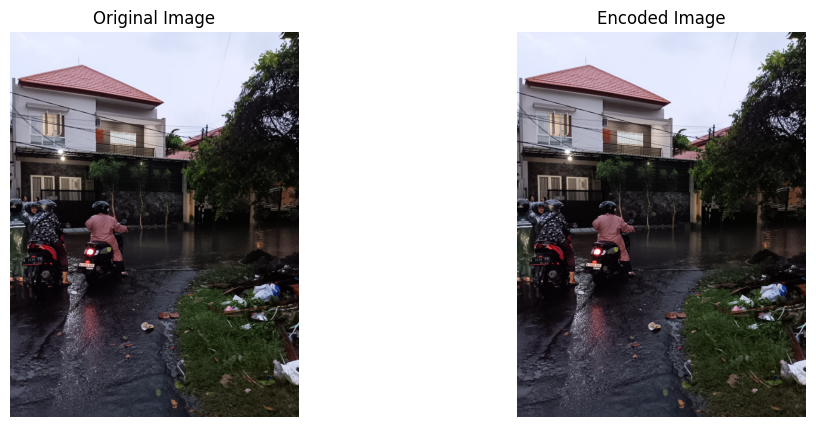

In [ ]:
import cv2
import torch
import lpips
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr_score, mean_squared_error as mse_score

def binary_to_string(binary_data):
    chars = [binary_data[i:i + 8] for i in range(0, len(binary_data), 8)]
    decoded = ''.join([chr(int(char, 2)) for char in chars])
    return decoded.split("#####")[0]

def decode_and_evaluate(original_image, encoded_image_path):
    encoded_image = Image.open(encoded_image_path).convert("RGB")
    np_encoded = np.array(encoded_image)

    binary_data = ""
    for i in range(np_encoded.shape[0]):
        for j in range(np_encoded.shape[1]):
            for k in range(3):  # RGB
                pixel_bin = format(np_encoded[i, j, k], '08b')
                binary_data += pixel_bin[-1]

    hidden_message = binary_to_string(binary_data)

    # Konversi ke format OpenCV (BGR) untuk beberapa metrik
    original_cv = np.array(original_image)
    encoded_cv = np.array(encoded_image)

    mse = mse_score(original_cv, encoded_cv)
    psnrlsb_hujan = psnr_score(original_cv, encoded_cv)
    embedded_bits = len(binary_data)
    height, width, channels = original_cv.shape
    capacity = embedded_bits / (height * width * channels)  # per channel-pixel
    bpp = embedded_bits / (height * width)                  # bits per pixel

    loss_fn = lpips.LPIPS(net='alex')
    o_tensor = torch.tensor(np.array(original_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    e_tensor = torch.tensor(np.array(encoded_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    lpips_val = loss_fn(o_tensor, e_tensor).item()

    nc = np.corrcoef(original_cv.flatten(), encoded_cv.flatten())[0, 1]

    print("Pesan tersembunyi:", hidden_message)
    print(f"Capacity: {capacity}")
    print(f"MSE: {mse:.4f}")
    print(f"PSNR: {psnrlsb_hujan:.2f} dB")
    print(f"NC: {nc:.4f}")
    print(f"LPIPS: {lpips_val:.4f}")
    print(f"BPP: {bpp} bits/pixel")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(encoded_image)
    axes[1].set_title("Encoded Image")
    axes[1].axis('off')

    plt.show()

decode_and_evaluate(original_img, "encoded_Hujan.png")

In [ ]:

import requests
from PIL import Image
import numpy as np
import io

def message_to_binary(message):
    return ''.join([format(ord(i), '08b') for i in message])

def encode_image(image_path, messages, output_path="encoded_Jalan.png"):
    image = Image.open(image_path).convert("RGB")
    np_image = np.array(image)

    combined_message = '|'.join(messages) + "#####"
    binary_message = message_to_binary(combined_message)

    binary_index = 0
    data_len = len(binary_message)

    for i in range(np_image.shape[0]):
        for j in range(np_image.shape[1]):
            for k in range(3):  # RGB
                if binary_index < data_len:
                    pixel = np_image[i, j, k]
                    pixel_bin = format(pixel, '08b')
                    new_pixel_bin = pixel_bin[:-1] + binary_message[binary_index]
                    np_image[i, j, k] = int(new_pixel_bin, 2)
                    binary_index += 1
        if binary_index >= data_len:
            break

    encoded_image = Image.fromarray(np_image)
    encoded_image.save(output_path)
    print(f"Pesan berhasil disisipkan. Gambar disimpan di: {output_path}")
    return image, encoded_image


image_path = "/content/sepanjang jalan kenangan.png"

pesan_pengguna = input("Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): ")
pesan_list = [msg.strip() for msg in pesan_pengguna.split(",")]

original_img, encoded_img = encode_image(image_path, pesan_list)

Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan, E2,  UNIVERSITAS NEGERI SURABAYA
Pesan berhasil disisipkan. Gambar disimpan di: encoded_Jalan.png


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Pesan tersembunyi: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0002
PSNR: 86.07 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


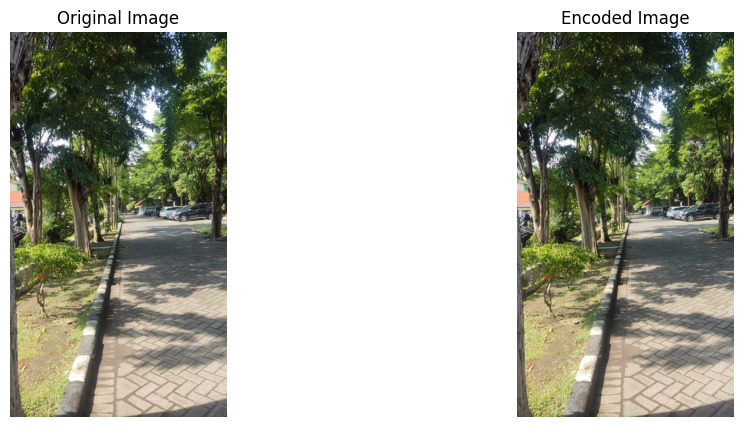

In [ ]:
import cv2
import torch
import lpips
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr_score, mean_squared_error as mse_score

def binary_to_string(binary_data):
    chars = [binary_data[i:i + 8] for i in range(0, len(binary_data), 8)]
    decoded = ''.join([chr(int(char, 2)) for char in chars])
    return decoded.split("#####")[0]

def decode_and_evaluate(original_image, encoded_image_path):
    encoded_image = Image.open(encoded_image_path).convert("RGB")
    np_encoded = np.array(encoded_image)

    binary_data = ""
    for i in range(np_encoded.shape[0]):
        for j in range(np_encoded.shape[1]):
            for k in range(3):  # RGB
                pixel_bin = format(np_encoded[i, j, k], '08b')
                binary_data += pixel_bin[-1]

    hidden_message = binary_to_string(binary_data)

    # Konversi ke format OpenCV (BGR) untuk beberapa metrik
    original_cv = np.array(original_image)
    encoded_cv = np.array(encoded_image)

    mse = mse_score(original_cv, encoded_cv)
    psnrlsb_jalan = psnr_score(original_cv, encoded_cv)
    embedded_bits = len(binary_data)
    height, width, channels = original_cv.shape
    capacity = embedded_bits / (height * width * channels)  # per channel-pixel
    bpp = embedded_bits / (height * width)                  # bits per pixel

    loss_fn = lpips.LPIPS(net='alex')
    o_tensor = torch.tensor(np.array(original_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    e_tensor = torch.tensor(np.array(encoded_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    lpips_val = loss_fn(o_tensor, e_tensor).item()

    nc = np.corrcoef(original_cv.flatten(), encoded_cv.flatten())[0, 1]

    print("Pesan tersembunyi:", hidden_message)
    print(f"Capacity: {capacity}")
    print(f"MSE: {mse:.4f}")
    print(f"PSNR: {psnrlsb_jalan:.2f} dB")
    print(f"NC: {nc:.4f}")
    print(f"LPIPS: {lpips_val:.4f}")
    print(f"BPP: {bpp} bits/pixel")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(encoded_image)
    axes[1].set_title("Encoded Image")
    axes[1].axis('off')

    plt.show()

decode_and_evaluate(original_img, "encoded_Jalan.png")

In [ ]:
import requests
from PIL import Image
import numpy as np
import io

def message_to_binary(message):
    return ''.join([format(ord(i), '08b') for i in message])

def encode_image(image_path, messages, output_path="encoded_Langit.png"):
    image = Image.open(image_path).convert("RGB")
    np_image = np.array(image)

    combined_message = '|'.join(messages) + "#####"
    binary_message = message_to_binary(combined_message)

    binary_index = 0
    data_len = len(binary_message)

    for i in range(np_image.shape[0]):
        for j in range(np_image.shape[1]):
            for k in range(3):  # RGB
                if binary_index < data_len:
                    pixel = np_image[i, j, k]
                    pixel_bin = format(pixel, '08b')
                    new_pixel_bin = pixel_bin[:-1] + binary_message[binary_index]
                    np_image[i, j, k] = int(new_pixel_bin, 2)
                    binary_index += 1
        if binary_index >= data_len:
            break

    encoded_image = Image.fromarray(np_image)
    encoded_image.save(output_path)
    print(f"Pesan berhasil disisipkan. Gambar disimpan di: {output_path}")
    return image, encoded_image


image_path = "/content/langit hampa.png"

pesan_pengguna = input("Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): ")
pesan_list = [msg.strip() for msg in pesan_pengguna.split(",")]

original_img, encoded_img = encode_image(image_path, pesan_list)

Masukkan pesan yang ingin disisipkan (pisahkan dengan koma jika lebih dari satu): Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan, E2,  UNIVERSITAS NEGERI SURABAYA
Pesan berhasil disisipkan. Gambar disimpan di: encoded_Langit.png


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth
Pesan tersembunyi: Perbedaan kelembapan udara di beberapa daerah dan pengaruhnya pada lingkungan|E2|UNIVERSITAS NEGERI SURABAYA
Capacity: 1.0
MSE: 0.0000
PSNR: 97.57 dB
NC: 1.0000
LPIPS: 0.0000
BPP: 3.0 bits/pixel


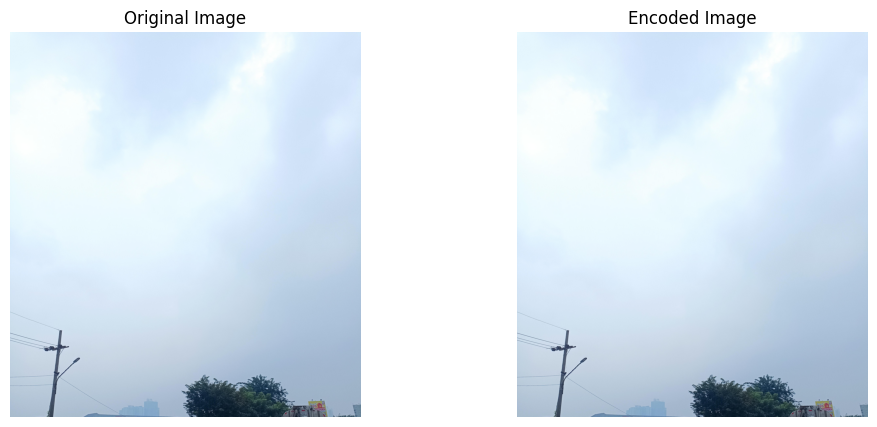

In [ ]:
import cv2
import torch
import lpips
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr_score, mean_squared_error as mse_score

def binary_to_string(binary_data):
    chars = [binary_data[i:i + 8] for i in range(0, len(binary_data), 8)]
    decoded = ''.join([chr(int(char, 2)) for char in chars])
    return decoded.split("#####")[0]

def decode_and_evaluate(original_image, encoded_image_path):
    encoded_image = Image.open(encoded_image_path).convert("RGB")
    np_encoded = np.array(encoded_image)

    binary_data = ""
    for i in range(np_encoded.shape[0]):
        for j in range(np_encoded.shape[1]):
            for k in range(3):  # RGB
                pixel_bin = format(np_encoded[i, j, k], '08b')
                binary_data += pixel_bin[-1]

    hidden_message = binary_to_string(binary_data)

    # Konversi ke format OpenCV (BGR) untuk beberapa metrik
    original_cv = np.array(original_image)
    encoded_cv = np.array(encoded_image)

    mse = mse_score(original_cv, encoded_cv)
    psnrlsb_langit = psnr_score(original_cv, encoded_cv)
    embedded_bits = len(binary_data)
    height, width, channels = original_cv.shape
    capacity = embedded_bits / (height * width * channels)  # per channel-pixel
    bpp = embedded_bits / (height * width)                  # bits per pixel

    loss_fn = lpips.LPIPS(net='alex')
    o_tensor = torch.tensor(np.array(original_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    e_tensor = torch.tensor(np.array(encoded_image).astype(np.float32) / 255.0).permute(2, 0, 1).unsqueeze(0)
    lpips_val = loss_fn(o_tensor, e_tensor).item()

    nc = np.corrcoef(original_cv.flatten(), encoded_cv.flatten())[0, 1]

    print("Pesan tersembunyi:", hidden_message)
    print(f"Capacity: {capacity}")
    print(f"MSE: {mse:.4f}")
    print(f"PSNR: {psnrlsb_langit:.2f} dB")
    print(f"NC: {nc:.4f}")
    print(f"LPIPS: {lpips_val:.4f}")
    print(f"BPP: {bpp} bits/pixel")

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(encoded_image)
    axes[1].set_title("Encoded Image")
    axes[1].axis('off')

    plt.show()

decode_and_evaluate(original_img, "encoded_Langit.png")

## Stegano ACO

In [ ]:
import lpips
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from tqdm import tqdm

class ACOSteganography:
    def __init__(self, alpha=1.0, beta=1.0, rho=0.1, psi=0.05, ants=50, iterations=100):
        self.alpha = alpha
        self.beta = beta
        self.rho = rho
        self.psi = psi
        self.ants = ants
        self.iterations = iterations
        self.ant_journeys = []

    def calculate_heuristic(self, image):
        sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
        magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
        magnitude = (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min() + 1e-10)
        return magnitude

    def initialize_pheromone(self, shape):
        return np.ones(shape) * 0.1

    def transition_probability(self, current_pos, neighbor_pos, pheromone, heuristic):
        tau = pheromone[neighbor_pos]
        eta = heuristic[neighbor_pos]
        numerator = (tau ** self.alpha) * (eta ** self.beta)
        denominator = np.sum((pheromone[neighbor_pos] ** self.alpha) * (heuristic[neighbor_pos] ** self.beta))
        if denominator == 0 or np.isnan(denominator):
            return 1e-10
        return numerator / denominator

    def update_pheromone(self, pheromone, heuristic, ant_paths):
        pheromone = (1 - self.rho) * pheromone
        delta_pheromone = np.zeros_like(pheromone)
        for start_pos, end_pos, path in ant_paths:
            for pos in path:
                delta_pheromone[pos] += heuristic[pos]
        pheromone += delta_pheromone
        pheromone = (1 - self.psi) * pheromone + self.psi * self.initialize_pheromone(pheromone.shape)
        return pheromone

    def detect_complex_regions(self, image):
        if len(image.shape) > 2:
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        else:
            gray_image = image

        height, width = gray_image.shape
        heuristic = self.calculate_heuristic(gray_image)
        pheromone = self.initialize_pheromone(gray_image.shape)
        self.ant_journeys = []
        for _ in tqdm(range(self.iterations), desc="ACO Optimization"):
            ant_paths = []
            for _ in range(self.ants):
                x, y = np.random.randint(0, width), np.random.randint(0, height)
                path = [(y, x)]
                for __ in range(100):
                    neighbors = []
                    probabilities = []
                    for dy in [-1, 0, 1]:
                        for dx in [-1, 0, 1]:
                            if dx == 0 and dy == 0:
                                continue
                            ny, nx = y + dy, x + dx
                            if 0 <= nx < width and 0 <= ny < height:
                                neighbors.append((ny, nx))
                                prob = self.transition_probability((y, x), (ny, nx), pheromone, heuristic)
                                probabilities.append(prob)
                    if not neighbors:
                        break
                    probabilities = np.array(probabilities)
                    prob_sum = probabilities.sum()
                    if prob_sum == 0 or np.isnan(prob_sum):
                        probabilities = np.ones_like(probabilities) / len(probabilities)
                    else:
                        probabilities /= prob_sum
                    next_idx = np.random.choice(len(neighbors), p=probabilities)
                    y, x = neighbors[next_idx]
                    path.append((y, x))
                start_pos = path[0]
                end_pos = path[-1]
                ant_paths.append((start_pos, end_pos, path))
            self.ant_journeys = [(start, end) for start, end, _ in ant_paths]
            pheromone = self.update_pheromone(pheromone, heuristic, ant_paths)

        threshold = np.mean(pheromone) * 1.2  # Stricter threshold
        complex_region = (pheromone >= threshold).astype(np.uint8)
        return complex_region, pheromone

    def embed_message(self, cover_image, secret_message, complex_region=None, seed_key=None):
        if complex_region is None:
            complex_region, _ = self.detect_complex_regions(cover_image)

        if isinstance(secret_message, str):
            secret_bits = ''.join(format(ord(c), '08b') for c in secret_message)
        else:
            secret_bits = ''.join(format(b, '08b') for b in secret_message)
        secret_bits = [int(b) for b in secret_bits]

        message_length = len(secret_bits)
        length_bits = [int(b) for b in format(message_length, '016b')]
        secret_bits = length_bits + secret_bits

        secret_idx = 0
        stego_image = cover_image.copy()
        if len(stego_image.shape) == 2:
            stego_image = np.expand_dims(stego_image, axis=-1)
        height, width, channels = stego_image.shape
        total_bits = len(secret_bits)
        embedded_bits = 0

        complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 1]
        non_complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 0]
        if seed_key is not None:
            np.random.seed(hash(seed_key) % 2**32)
        np.random.shuffle(complex_positions)
        np.random.shuffle(non_complex_positions)
        positions = complex_positions + non_complex_positions

        available_bits = len(complex_positions) * channels
        if available_bits < total_bits:
            print(f"Warning: Complex region capacity ({available_bits} bits) insufficient. Using non-complex pixels.")

        for pos in positions:
            y, x = pos
            for c in range(channels):
                if secret_idx >= total_bits:
                    break
                pixel_val = stego_image[y, x, c]
                bit_to_embed = secret_bits[secret_idx]
                current_lsb = pixel_val & 1
                if current_lsb != bit_to_embed:
                    stego_image[y, x, c] = (pixel_val & 0xFE) | bit_to_embed
                secret_idx += 1
                embedded_bits += 1
            if secret_idx >= total_bits:
                break

        capacity = embedded_bits / (height * width * channels)
        return stego_image.squeeze(), capacity

    def extract_message(self, stego_image, complex_region, seed_key=None):
        if len(stego_image.shape) == 2:
            stego_image = np.expand_dims(stego_image, axis=-1)
        height, width, channels = stego_image.shape
        extracted_bits = []

        complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 1]
        non_complex_positions = [(y, x) for y in range(height) for x in range(width) if complex_region[y, x] == 0]
        if seed_key is not None:
            np.random.seed(hash(seed_key) % 2**32)
        np.random.shuffle(complex_positions)
        np.random.shuffle(non_complex_positions)
        positions = complex_positions + non_complex_positions

        secret_idx = 0
        for pos in positions:
            y, x = pos
            for c in range(channels):
                pixel_val = stego_image[y, x, c]
                extracted_bits.append(pixel_val & 1)
                secret_idx += 1
                if secret_idx >= 16 + 10000:
                    break
            if secret_idx >= 16 + 10000:
                break

        if len(extracted_bits) < 16:
            print("Error: Could not extract length bits")
            return b''

        length_bits = extracted_bits[:16]
        message_length = int(''.join(map(str, length_bits)), 2)

        if len(extracted_bits) < 16 + message_length:
            print(f"Error: Extracted {len(extracted_bits) - 16} bits, but need {message_length}")
            return b''

        message_bits = extracted_bits[16:16 + message_length]
        message_bytes = []
        for i in range(0, len(message_bits), 8):
            byte_bits = message_bits[i:i+8]
            if len(byte_bits) == 8:
                byte = int(''.join(map(str, byte_bits)), 2)
                message_bytes.append(byte)

        return bytes(message_bytes)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/alex.pth

=== Testing /content/citra 1.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:17<00:00,  5.87it/s]


Complex pixels: 4404
Ant Journeys (start_pos -> end_pos):
Ant 1: (259, 360) -> (263, 349)
Ant 2: (476, 34) -> (473, 27)
Ant 3: (739, 493) -> (759, 494)
Ant 4: (784, 254) -> (778, 248)
Ant 5: (431, 470) -> (433, 468)
Ant 6: (680, 14) -> (686, 21)
Ant 7: (383, 227) -> (391, 243)
Ant 8: (398, 78) -> (383, 89)
Ant 9: (364, 233) -> (369, 254)
Ant 10: (903, 319) -> (895, 331)
Stego image saved as: /content/citra_1_stego_10.jpg


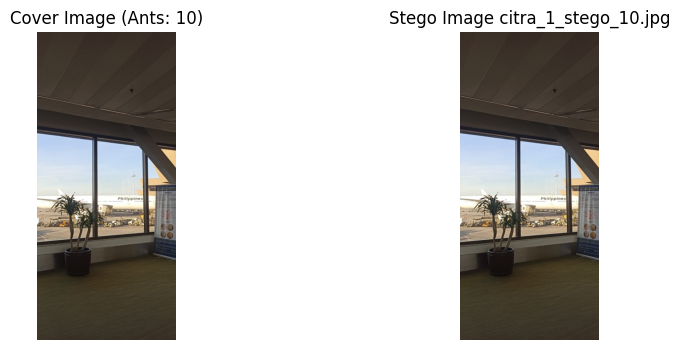

Evaluation Metrics for citra_1_stego_10.jpg:
Capacity       : 0.0004
PSNR (dB)      : 85.69
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 1.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:46<00:00,  2.14it/s]


Complex pixels: 11658
Ant Journeys (start_pos -> end_pos):
Ant 1: (997, 21) -> (1011, 19)
Ant 2: (344, 414) -> (348, 415)
Ant 3: (336, 450) -> (334, 454)
Ant 4: (225, 368) -> (226, 360)
Ant 5: (393, 460) -> (393, 460)
Ant 6: (275, 302) -> (289, 304)
Ant 7: (761, 114) -> (767, 102)
Ant 8: (592, 272) -> (576, 268)
Ant 9: (769, 519) -> (761, 505)
Ant 10: (154, 116) -> (152, 111)
Ant 11: (573, 88) -> (575, 94)
Ant 12: (549, 7) -> (536, 2)
Ant 13: (809, 297) -> (802, 298)
Ant 14: (144, 115) -> (144, 112)
Ant 15: (799, 331) -> (789, 319)
Ant 16: (650, 124) -> (650, 125)
Ant 17: (115, 93) -> (120, 96)
Ant 18: (888, 276) -> (888, 282)
Ant 19: (536, 9) -> (530, 15)
Ant 20: (649, 394) -> (646, 387)
Ant 21: (766, 412) -> (775, 419)
Ant 22: (787, 113) -> (785, 106)
Ant 23: (1099, 50) -> (1105, 41)
Ant 24: (105, 269) -> (112, 271)
Ant 25: (651, 10) -> (651, 13)
Ant 26: (1149, 317) -> (1151, 310)
Ant 27: (953, 346) -> (950, 339)
Ant 28: (921, 48) -> (920, 68)
Ant 29: (556, 516) -> (551, 516)
Ant 30:

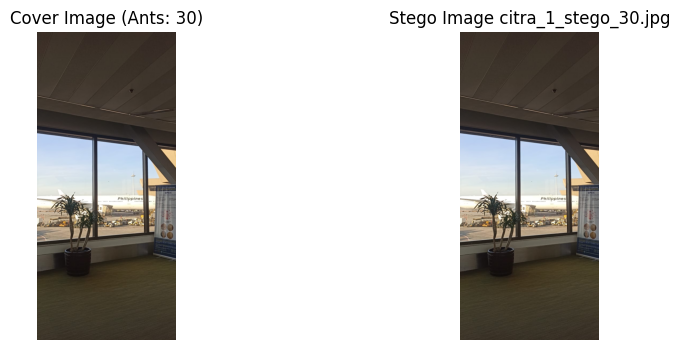

Evaluation Metrics for citra_1_stego_30.jpg:
Capacity       : 0.0004
PSNR (dB)      : 85.44
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 1.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:17<00:00,  1.29it/s]


Complex pixels: 17087
Ant Journeys (start_pos -> end_pos):
Ant 1: (998, 456) -> (1004, 475)
Ant 2: (320, 137) -> (315, 148)
Ant 3: (368, 380) -> (365, 368)
Ant 4: (932, 361) -> (938, 358)
Ant 5: (732, 31) -> (736, 16)
Ant 6: (175, 357) -> (175, 365)
Ant 7: (203, 93) -> (206, 104)
Ant 8: (124, 464) -> (120, 461)
Ant 9: (588, 391) -> (588, 397)
Ant 10: (222, 79) -> (229, 86)
Ant 11: (819, 83) -> (812, 82)
Ant 12: (438, 409) -> (431, 414)
Ant 13: (338, 252) -> (342, 263)
Ant 14: (570, 481) -> (582, 484)
Ant 15: (161, 53) -> (152, 57)
Ant 16: (65, 335) -> (53, 330)
Ant 17: (645, 272) -> (648, 270)
Ant 18: (1058, 40) -> (1057, 27)
Ant 19: (1092, 369) -> (1098, 364)
Ant 20: (273, 186) -> (274, 167)
Ant 21: (410, 236) -> (417, 236)
Ant 22: (20, 13) -> (15, 19)
Ant 23: (529, 237) -> (526, 226)
Ant 24: (146, 409) -> (140, 401)
Ant 25: (351, 477) -> (354, 483)
Ant 26: (129, 503) -> (122, 500)
Ant 27: (1146, 379) -> (1155, 384)
Ant 28: (414, 428) -> (415, 415)
Ant 29: (920, 329) -> (923, 331)
Ant

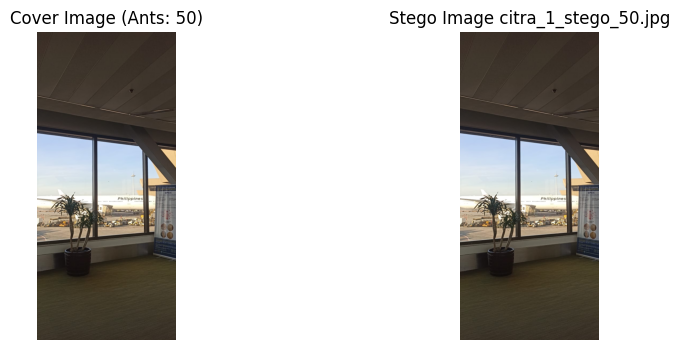

Evaluation Metrics for citra_1_stego_50.jpg:
Capacity       : 0.0004
PSNR (dB)      : 85.60
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 1.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:50<00:00,  1.11s/it]


Complex pixels: 22731
Ant Journeys (start_pos -> end_pos):
Ant 1: (204, 407) -> (206, 411)
Ant 2: (232, 140) -> (231, 143)
Ant 3: (611, 411) -> (626, 419)
Ant 4: (1110, 220) -> (1126, 222)
Ant 5: (832, 279) -> (829, 275)
Ant 6: (120, 9) -> (133, 11)
Ant 7: (165, 390) -> (176, 382)
Ant 8: (309, 34) -> (308, 39)
Ant 9: (372, 29) -> (360, 29)
Ant 10: (216, 412) -> (215, 400)
Ant 11: (19, 188) -> (32, 189)
Ant 12: (792, 473) -> (792, 473)
Ant 13: (954, 415) -> (951, 424)
Ant 14: (568, 323) -> (574, 326)
Ant 15: (550, 353) -> (552, 350)
Ant 16: (1152, 169) -> (1149, 170)
Ant 17: (1138, 283) -> (1148, 284)
Ant 18: (345, 269) -> (343, 271)
Ant 19: (410, 221) -> (406, 221)
Ant 20: (625, 186) -> (627, 192)
Ant 21: (423, 457) -> (435, 447)
Ant 22: (38, 63) -> (46, 64)
Ant 23: (213, 443) -> (218, 454)
Ant 24: (527, 241) -> (519, 234)
Ant 25: (564, 47) -> (573, 34)
Ant 26: (1065, 302) -> (1064, 310)
Ant 27: (256, 167) -> (255, 157)
Ant 28: (94, 485) -> (92, 489)
Ant 29: (790, 297) -> (801, 293)
An

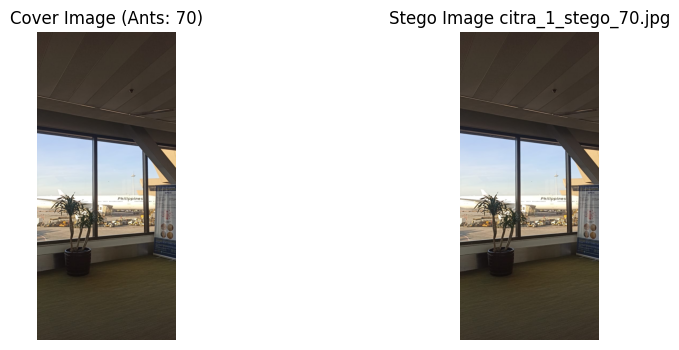

Evaluation Metrics for citra_1_stego_70.jpg:
Capacity       : 0.0004
PSNR (dB)      : 85.95
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 1.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:35<00:00,  1.55s/it]


Complex pixels: 28300
Ant Journeys (start_pos -> end_pos):
Ant 1: (104, 236) -> (97, 232)
Ant 2: (1038, 460) -> (1037, 454)
Ant 3: (645, 21) -> (643, 26)
Ant 4: (535, 406) -> (532, 422)
Ant 5: (37, 518) -> (36, 511)
Ant 6: (65, 439) -> (53, 433)
Ant 7: (1022, 66) -> (1017, 60)
Ant 8: (853, 59) -> (848, 56)
Ant 9: (1110, 490) -> (1116, 489)
Ant 10: (414, 398) -> (421, 406)
Ant 11: (823, 96) -> (823, 84)
Ant 12: (153, 192) -> (149, 203)
Ant 13: (255, 97) -> (256, 95)
Ant 14: (506, 176) -> (503, 182)
Ant 15: (220, 201) -> (216, 199)
Ant 16: (932, 180) -> (948, 181)
Ant 17: (552, 52) -> (556, 40)
Ant 18: (802, 275) -> (804, 270)
Ant 19: (962, 342) -> (964, 333)
Ant 20: (341, 264) -> (328, 269)
Ant 21: (786, 394) -> (792, 390)
Ant 22: (220, 70) -> (208, 77)
Ant 23: (152, 7) -> (153, 4)
Ant 24: (625, 373) -> (634, 367)
Ant 25: (714, 80) -> (706, 65)
Ant 26: (628, 415) -> (623, 417)
Ant 27: (1144, 399) -> (1154, 385)
Ant 28: (425, 228) -> (431, 232)
Ant 29: (228, 13) -> (227, 15)
Ant 30: (835

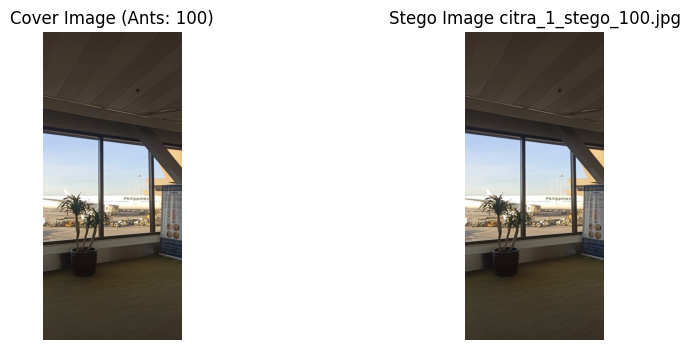

Evaluation Metrics for citra_1_stego_100.jpg:
Capacity       : 0.0004
PSNR (dB)      : 85.86
MSE            : 0.0002
NC             : 1.0000
BPP            : 0.0003
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 2.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:44<00:00,  2.23it/s]


Complex pixels: 2093
Ant Journeys (start_pos -> end_pos):
Ant 1: (1306, 283) -> (1301, 287)
Ant 2: (3295, 2798) -> (3288, 2808)
Ant 3: (606, 377) -> (607, 376)
Ant 4: (2363, 538) -> (2358, 540)
Ant 5: (915, 2839) -> (927, 2836)
Ant 6: (3805, 2396) -> (3814, 2389)
Ant 7: (368, 1955) -> (361, 1956)
Ant 8: (3205, 1331) -> (3207, 1327)
Ant 9: (1238, 531) -> (1247, 529)
Ant 10: (3600, 1736) -> (3603, 1748)
Stego image saved as: /content/citra_2_stego_10.jpg


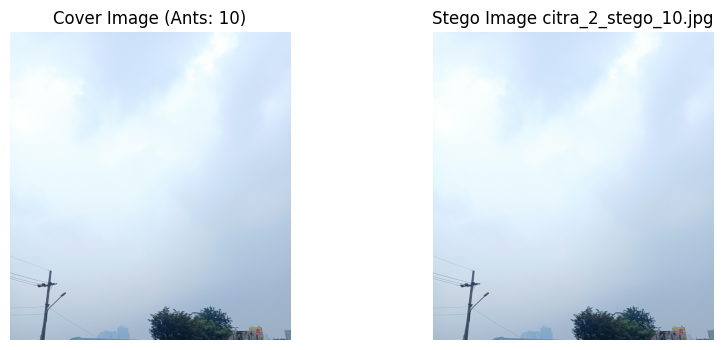

Evaluation Metrics for citra_2_stego_10.jpg:
Capacity       : 0.0000
PSNR (dB)      : 99.13
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 2.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:23<00:00,  1.19it/s]


Complex pixels: 6371
Ant Journeys (start_pos -> end_pos):
Ant 1: (1781, 74) -> (1778, 79)
Ant 2: (1762, 3346) -> (1753, 3352)
Ant 3: (2407, 3296) -> (2397, 3312)
Ant 4: (346, 1048) -> (362, 1048)
Ant 5: (2429, 2865) -> (2432, 2868)
Ant 6: (2630, 1118) -> (2634, 1114)
Ant 7: (3351, 3315) -> (3345, 3324)
Ant 8: (1902, 668) -> (1887, 668)
Ant 9: (995, 1038) -> (983, 1036)
Ant 10: (796, 3399) -> (791, 3386)
Ant 11: (3228, 2847) -> (3229, 2844)
Ant 12: (319, 538) -> (315, 535)
Ant 13: (3330, 580) -> (3338, 577)
Ant 14: (1179, 796) -> (1168, 807)
Ant 15: (2881, 2128) -> (2888, 2136)
Ant 16: (1613, 418) -> (1613, 408)
Ant 17: (1398, 704) -> (1410, 698)
Ant 18: (2989, 1240) -> (2992, 1248)
Ant 19: (3776, 1804) -> (3778, 1799)
Ant 20: (2557, 1681) -> (2563, 1672)
Ant 21: (2988, 1339) -> (2988, 1351)
Ant 22: (2844, 2046) -> (2856, 2055)
Ant 23: (1628, 2899) -> (1616, 2890)
Ant 24: (2332, 421) -> (2331, 415)
Ant 25: (3469, 2792) -> (3472, 2784)
Ant 26: (1299, 645) -> (1296, 639)
Ant 27: (2362, 24

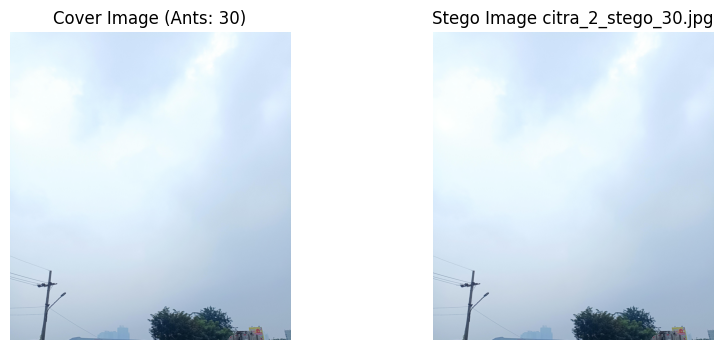

Evaluation Metrics for citra_2_stego_30.jpg:
Capacity       : 0.0000
PSNR (dB)      : 99.37
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 2.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:38<00:00,  1.01it/s]


Complex pixels: 10052
Ant Journeys (start_pos -> end_pos):
Ant 1: (143, 3183) -> (138, 3180)
Ant 2: (2289, 2537) -> (2285, 2539)
Ant 3: (1133, 2779) -> (1126, 2765)
Ant 4: (1168, 1106) -> (1167, 1111)
Ant 5: (1622, 2006) -> (1619, 2003)
Ant 6: (1745, 986) -> (1749, 983)
Ant 7: (1555, 2881) -> (1548, 2890)
Ant 8: (416, 664) -> (423, 655)
Ant 9: (2651, 2353) -> (2655, 2340)
Ant 10: (270, 475) -> (268, 463)
Ant 11: (3625, 3139) -> (3631, 3140)
Ant 12: (1548, 1801) -> (1551, 1811)
Ant 13: (3809, 1711) -> (3808, 1717)
Ant 14: (63, 523) -> (64, 533)
Ant 15: (3363, 930) -> (3359, 932)
Ant 16: (227, 1055) -> (231, 1055)
Ant 17: (346, 2430) -> (352, 2431)
Ant 18: (1373, 1514) -> (1365, 1507)
Ant 19: (2810, 685) -> (2810, 692)
Ant 20: (2289, 2441) -> (2282, 2432)
Ant 21: (660, 1181) -> (659, 1176)
Ant 22: (3767, 757) -> (3775, 755)
Ant 23: (347, 3443) -> (339, 3458)
Ant 24: (3161, 2402) -> (3161, 2395)
Ant 25: (1685, 2398) -> (1674, 2399)
Ant 26: (2536, 591) -> (2543, 597)
Ant 27: (3170, 1220) -

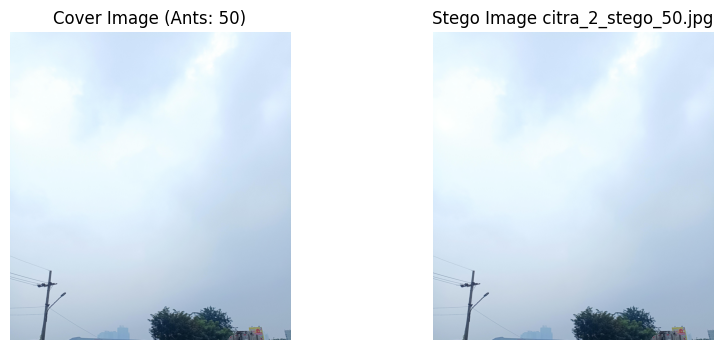

Evaluation Metrics for citra_2_stego_50.jpg:
Capacity       : 0.0000
PSNR (dB)      : 98.91
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 2.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:07<00:00,  1.28s/it]


Complex pixels: 14469
Ant Journeys (start_pos -> end_pos):
Ant 1: (1697, 3002) -> (1693, 3000)
Ant 2: (1885, 986) -> (1882, 991)
Ant 3: (1921, 2185) -> (1910, 2167)
Ant 4: (1706, 1568) -> (1695, 1571)
Ant 5: (2386, 2047) -> (2387, 2047)
Ant 6: (3060, 2218) -> (3056, 2208)
Ant 7: (2129, 503) -> (2134, 506)
Ant 8: (355, 1272) -> (350, 1274)
Ant 9: (1120, 2109) -> (1116, 2097)
Ant 10: (994, 1735) -> (988, 1736)
Ant 11: (877, 431) -> (874, 428)
Ant 12: (3551, 11) -> (3566, 10)
Ant 13: (606, 506) -> (619, 514)
Ant 14: (1457, 2514) -> (1457, 2520)
Ant 15: (3254, 2924) -> (3267, 2904)
Ant 16: (2245, 1625) -> (2237, 1615)
Ant 17: (287, 2905) -> (294, 2903)
Ant 18: (1379, 2083) -> (1372, 2087)
Ant 19: (1923, 1019) -> (1925, 1033)
Ant 20: (2368, 3146) -> (2348, 3149)
Ant 21: (583, 2883) -> (576, 2874)
Ant 22: (1477, 731) -> (1488, 739)
Ant 23: (1873, 198) -> (1873, 206)
Ant 24: (408, 1537) -> (401, 1535)
Ant 25: (1377, 1826) -> (1365, 1809)
Ant 26: (3023, 833) -> (3024, 832)
Ant 27: (1965, 1768)

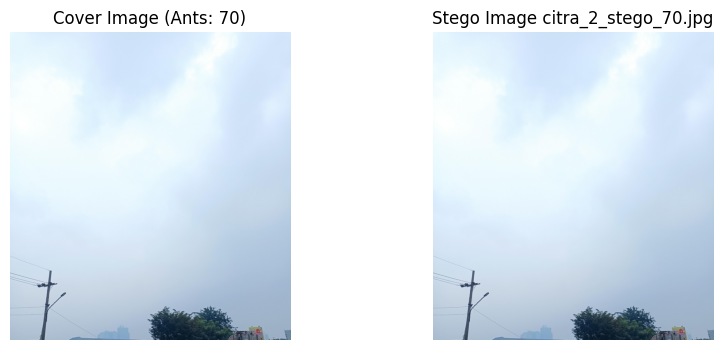

Evaluation Metrics for citra_2_stego_70.jpg:
Capacity       : 0.0000
PSNR (dB)      : 99.02
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 2.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [03:12<00:00,  1.92s/it]


Complex pixels: 20765
Ant Journeys (start_pos -> end_pos):
Ant 1: (3121, 806) -> (3118, 801)
Ant 2: (189, 3201) -> (181, 3192)
Ant 3: (788, 3094) -> (788, 3095)
Ant 4: (1706, 243) -> (1696, 229)
Ant 5: (1827, 2404) -> (1827, 2405)
Ant 6: (1132, 2664) -> (1137, 2656)
Ant 7: (3654, 462) -> (3658, 455)
Ant 8: (853, 2070) -> (853, 2072)
Ant 9: (2968, 187) -> (2959, 197)
Ant 10: (319, 3418) -> (319, 3419)
Ant 11: (3171, 189) -> (3166, 181)
Ant 12: (1289, 343) -> (1295, 345)
Ant 13: (3319, 912) -> (3328, 915)
Ant 14: (3355, 871) -> (3359, 870)
Ant 15: (1786, 2614) -> (1787, 2607)
Ant 16: (1050, 2737) -> (1056, 2742)
Ant 17: (2005, 2238) -> (2007, 2240)
Ant 18: (3779, 2451) -> (3763, 2463)
Ant 19: (116, 438) -> (116, 443)
Ant 20: (3470, 907) -> (3472, 899)
Ant 21: (2516, 2372) -> (2517, 2381)
Ant 22: (899, 762) -> (897, 760)
Ant 23: (51, 270) -> (48, 269)
Ant 24: (669, 2082) -> (663, 2083)
Ant 25: (2949, 1617) -> (2952, 1620)
Ant 26: (2259, 1999) -> (2254, 1994)
Ant 27: (855, 2746) -> (851, 2

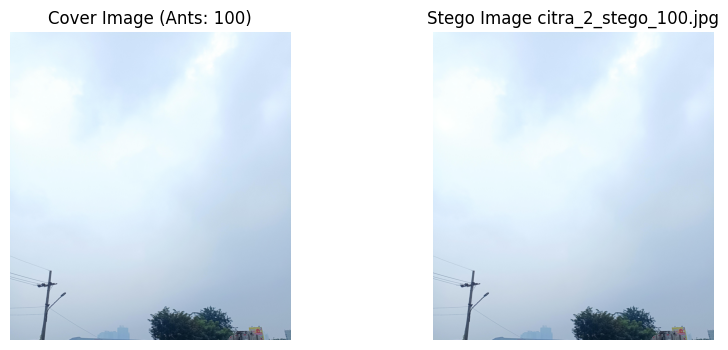

Evaluation Metrics for citra_2_stego_100.jpg:
Capacity       : 0.0000
PSNR (dB)      : 99.03
MSE            : 0.0000
NC             : 1.0000
BPP            : 0.0000
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 3.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:18<00:00,  5.34it/s]


Complex pixels: 10005
Ant Journeys (start_pos -> end_pos):
Ant 1: (32, 307) -> (44, 310)
Ant 2: (852, 238) -> (855, 226)
Ant 3: (809, 307) -> (819, 299)
Ant 4: (282, 33) -> (288, 32)
Ant 5: (820, 274) -> (829, 280)
Ant 6: (510, 356) -> (517, 347)
Ant 7: (466, 381) -> (466, 372)
Ant 8: (760, 308) -> (765, 305)
Ant 9: (460, 696) -> (472, 706)
Ant 10: (984, 695) -> (992, 684)
Stego image saved as: /content/citra_3_stego_10.jpg


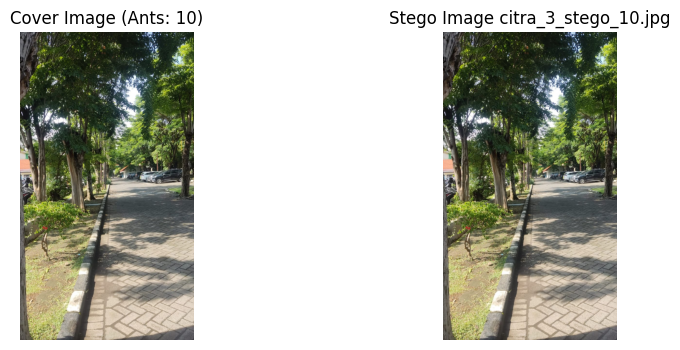

Evaluation Metrics for citra_3_stego_10.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.21
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 3.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:02<00:00,  1.61it/s]


Complex pixels: 27657
Ant Journeys (start_pos -> end_pos):
Ant 1: (638, 236) -> (637, 242)
Ant 2: (674, 191) -> (666, 198)
Ant 3: (1221, 457) -> (1241, 439)
Ant 4: (107, 713) -> (109, 701)
Ant 5: (4, 126) -> (3, 124)
Ant 6: (863, 475) -> (873, 473)
Ant 7: (549, 671) -> (563, 680)
Ant 8: (988, 43) -> (992, 48)
Ant 9: (955, 666) -> (950, 668)
Ant 10: (981, 161) -> (969, 171)
Ant 11: (1233, 400) -> (1236, 394)
Ant 12: (1006, 263) -> (1000, 253)
Ant 13: (312, 655) -> (306, 647)
Ant 14: (471, 603) -> (464, 587)
Ant 15: (1082, 122) -> (1077, 111)
Ant 16: (834, 676) -> (828, 662)
Ant 17: (143, 193) -> (132, 196)
Ant 18: (1130, 435) -> (1139, 431)
Ant 19: (1191, 154) -> (1194, 149)
Ant 20: (706, 362) -> (710, 361)
Ant 21: (21, 172) -> (25, 182)
Ant 22: (1136, 165) -> (1133, 172)
Ant 23: (179, 80) -> (180, 76)
Ant 24: (700, 206) -> (694, 195)
Ant 25: (205, 584) -> (207, 573)
Ant 26: (1167, 678) -> (1163, 674)
Ant 27: (706, 6) -> (725, 8)
Ant 28: (320, 74) -> (314, 83)
Ant 29: (270, 516) -> (277

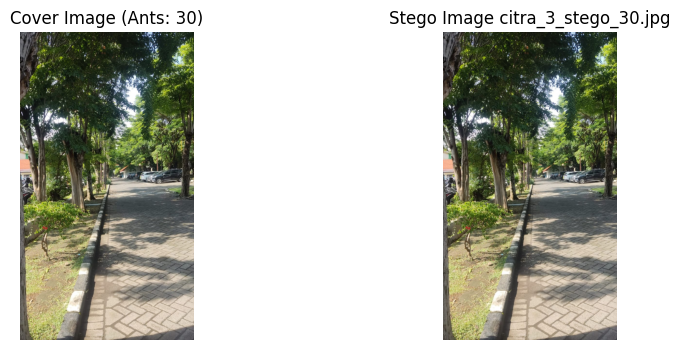

Evaluation Metrics for citra_3_stego_30.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.25
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 3.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:48<00:00,  1.08s/it]


Complex pixels: 41879
Ant Journeys (start_pos -> end_pos):
Ant 1: (421, 680) -> (429, 672)
Ant 2: (838, 251) -> (837, 232)
Ant 3: (509, 240) -> (513, 239)
Ant 4: (650, 445) -> (637, 435)
Ant 5: (691, 610) -> (683, 610)
Ant 6: (1106, 544) -> (1101, 558)
Ant 7: (1138, 481) -> (1142, 479)
Ant 8: (1155, 48) -> (1154, 58)
Ant 9: (939, 396) -> (930, 381)
Ant 10: (857, 549) -> (867, 548)
Ant 11: (984, 222) -> (993, 221)
Ant 12: (331, 472) -> (341, 470)
Ant 13: (0, 417) -> (9, 427)
Ant 14: (501, 316) -> (505, 317)
Ant 15: (901, 453) -> (894, 452)
Ant 16: (552, 493) -> (543, 491)
Ant 17: (1249, 21) -> (1250, 26)
Ant 18: (1277, 284) -> (1274, 299)
Ant 19: (1279, 684) -> (1270, 686)
Ant 20: (507, 68) -> (498, 86)
Ant 21: (1158, 53) -> (1148, 57)
Ant 22: (966, 611) -> (981, 614)
Ant 23: (1158, 338) -> (1157, 343)
Ant 24: (927, 109) -> (926, 99)
Ant 25: (484, 101) -> (487, 96)
Ant 26: (426, 282) -> (422, 283)
Ant 27: (251, 30) -> (250, 40)
Ant 28: (1141, 433) -> (1157, 436)
Ant 29: (401, 533) -> (4

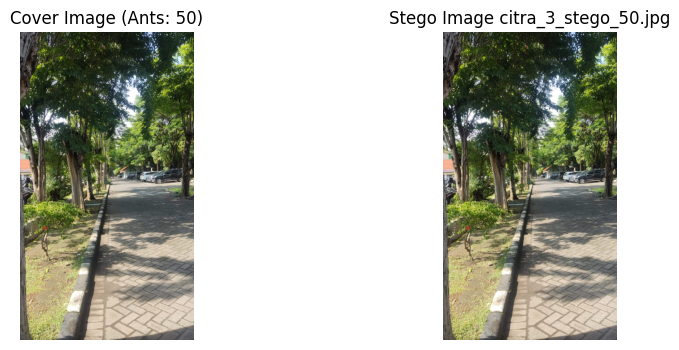

Evaluation Metrics for citra_3_stego_50.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.76
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 3.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:06<00:00,  1.27s/it]


Complex pixels: 54580
Ant Journeys (start_pos -> end_pos):
Ant 1: (448, 575) -> (445, 584)
Ant 2: (267, 382) -> (257, 399)
Ant 3: (0, 246) -> (5, 252)
Ant 4: (277, 55) -> (274, 63)
Ant 5: (258, 228) -> (252, 232)
Ant 6: (1188, 700) -> (1206, 691)
Ant 7: (1082, 455) -> (1093, 463)
Ant 8: (1086, 469) -> (1078, 456)
Ant 9: (343, 64) -> (333, 64)
Ant 10: (905, 474) -> (909, 476)
Ant 11: (947, 174) -> (941, 174)
Ant 12: (412, 690) -> (408, 710)
Ant 13: (1050, 191) -> (1063, 189)
Ant 14: (246, 500) -> (258, 489)
Ant 15: (785, 622) -> (794, 634)
Ant 16: (180, 337) -> (160, 337)
Ant 17: (447, 100) -> (448, 87)
Ant 18: (932, 280) -> (937, 288)
Ant 19: (1163, 419) -> (1157, 433)
Ant 20: (763, 156) -> (762, 152)
Ant 21: (199, 327) -> (202, 321)
Ant 22: (156, 227) -> (138, 221)
Ant 23: (653, 435) -> (649, 440)
Ant 24: (60, 352) -> (61, 346)
Ant 25: (255, 460) -> (257, 449)
Ant 26: (661, 120) -> (647, 115)
Ant 27: (1002, 205) -> (1009, 202)
Ant 28: (843, 248) -> (838, 251)
Ant 29: (875, 129) -> (86

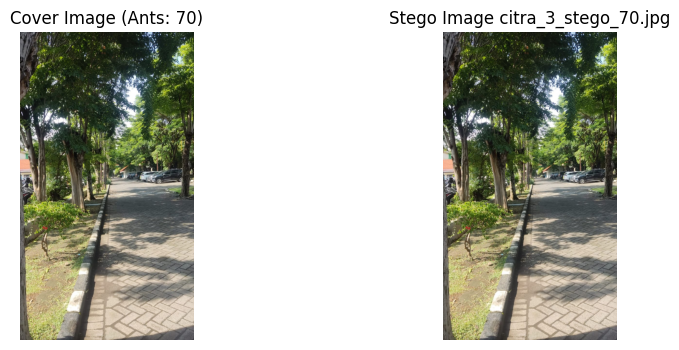

Evaluation Metrics for citra_3_stego_70.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.44
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 3.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:39<00:00,  1.60s/it]


Complex pixels: 69968
Ant Journeys (start_pos -> end_pos):
Ant 1: (93, 307) -> (92, 291)
Ant 2: (547, 75) -> (550, 84)
Ant 3: (1128, 513) -> (1143, 531)
Ant 4: (1027, 52) -> (1032, 52)
Ant 5: (915, 291) -> (908, 292)
Ant 6: (713, 293) -> (728, 281)
Ant 7: (56, 72) -> (61, 69)
Ant 8: (1083, 598) -> (1089, 600)
Ant 9: (378, 611) -> (378, 630)
Ant 10: (1226, 105) -> (1235, 80)
Ant 11: (104, 484) -> (101, 487)
Ant 12: (570, 574) -> (557, 566)
Ant 13: (303, 391) -> (296, 379)
Ant 14: (569, 563) -> (575, 567)
Ant 15: (616, 29) -> (614, 24)
Ant 16: (960, 274) -> (945, 271)
Ant 17: (605, 624) -> (598, 624)
Ant 18: (489, 5) -> (489, 7)
Ant 19: (159, 115) -> (150, 128)
Ant 20: (325, 112) -> (322, 116)
Ant 21: (1029, 388) -> (1033, 377)
Ant 22: (853, 192) -> (846, 190)
Ant 23: (424, 133) -> (416, 133)
Ant 24: (471, 534) -> (477, 510)
Ant 25: (897, 10) -> (894, 4)
Ant 26: (230, 53) -> (229, 63)
Ant 27: (568, 473) -> (571, 462)
Ant 28: (300, 416) -> (296, 419)
Ant 29: (451, 265) -> (448, 282)
Ant 3

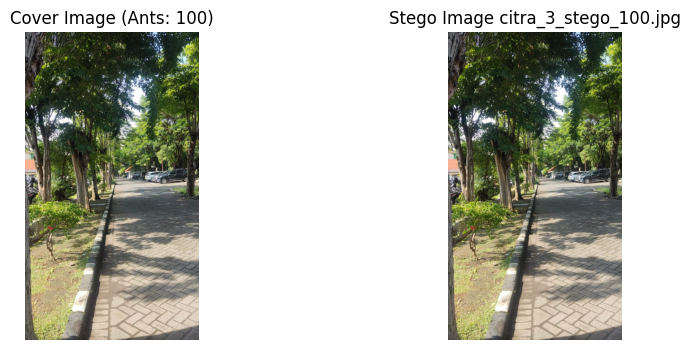

Evaluation Metrics for citra_3_stego_100.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.53
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 4.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:18<00:00,  5.34it/s]


Complex pixels: 9674
Ant Journeys (start_pos -> end_pos):
Ant 1: (17, 750) -> (36, 753)
Ant 2: (716, 237) -> (728, 235)
Ant 3: (668, 624) -> (662, 628)
Ant 4: (43, 151) -> (64, 123)
Ant 5: (731, 692) -> (735, 698)
Ant 6: (118, 735) -> (121, 735)
Ant 7: (600, 839) -> (591, 837)
Ant 8: (738, 328) -> (743, 330)
Ant 9: (366, 10) -> (366, 2)
Ant 10: (791, 1041) -> (795, 1026)
Stego image saved as: /content/citra_4_stego_10.jpg


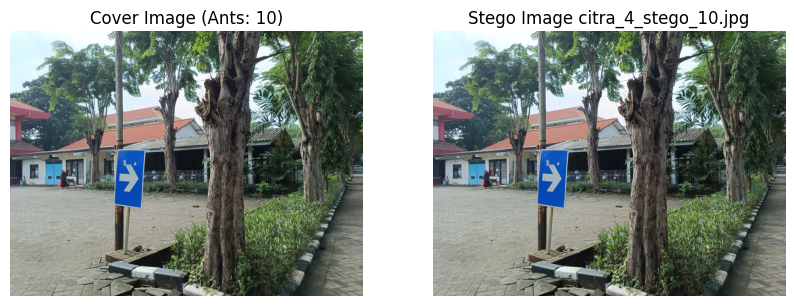

Evaluation Metrics for citra_4_stego_10.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.88
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 4.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:48<00:00,  2.05it/s]


Complex pixels: 27373
Ant Journeys (start_pos -> end_pos):
Ant 1: (817, 18) -> (822, 0)
Ant 2: (826, 1025) -> (835, 1022)
Ant 3: (729, 900) -> (714, 903)
Ant 4: (735, 182) -> (718, 182)
Ant 5: (773, 115) -> (771, 114)
Ant 6: (768, 329) -> (755, 332)
Ant 7: (540, 905) -> (547, 905)
Ant 8: (846, 380) -> (844, 379)
Ant 9: (733, 102) -> (740, 116)
Ant 10: (151, 177) -> (143, 183)
Ant 11: (831, 1061) -> (824, 1061)
Ant 12: (348, 1029) -> (346, 1028)
Ant 13: (317, 194) -> (317, 212)
Ant 14: (513, 357) -> (507, 342)
Ant 15: (233, 1011) -> (238, 997)
Ant 16: (307, 273) -> (298, 285)
Ant 17: (243, 418) -> (246, 430)
Ant 18: (148, 494) -> (142, 492)
Ant 19: (355, 53) -> (367, 44)
Ant 20: (712, 1001) -> (709, 996)
Ant 21: (58, 506) -> (58, 515)
Ant 22: (283, 778) -> (272, 786)
Ant 23: (390, 400) -> (396, 397)
Ant 24: (24, 14) -> (22, 21)
Ant 25: (103, 1030) -> (102, 1034)
Ant 26: (169, 1127) -> (172, 1137)
Ant 27: (540, 47) -> (548, 37)
Ant 28: (32, 923) -> (35, 912)
Ant 29: (401, 870) -> (411, 8

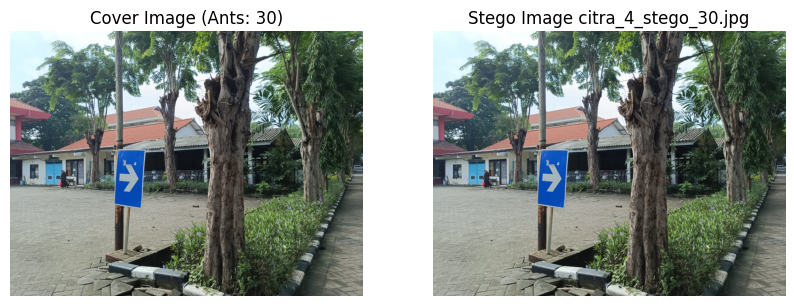

Evaluation Metrics for citra_4_stego_30.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.77
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 4.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:18<00:00,  1.27it/s]


Complex pixels: 41813
Ant Journeys (start_pos -> end_pos):
Ant 1: (589, 993) -> (587, 987)
Ant 2: (195, 545) -> (188, 519)
Ant 3: (716, 884) -> (709, 889)
Ant 4: (732, 1134) -> (730, 1152)
Ant 5: (730, 900) -> (731, 898)
Ant 6: (241, 419) -> (251, 409)
Ant 7: (403, 580) -> (403, 568)
Ant 8: (165, 365) -> (150, 375)
Ant 9: (132, 762) -> (133, 754)
Ant 10: (358, 730) -> (365, 727)
Ant 11: (621, 538) -> (618, 535)
Ant 12: (747, 429) -> (745, 440)
Ant 13: (760, 389) -> (768, 367)
Ant 14: (695, 783) -> (697, 791)
Ant 15: (475, 914) -> (473, 917)
Ant 16: (757, 263) -> (756, 255)
Ant 17: (623, 522) -> (630, 514)
Ant 18: (610, 523) -> (595, 521)
Ant 19: (103, 884) -> (100, 901)
Ant 20: (378, 833) -> (368, 824)
Ant 21: (584, 317) -> (570, 313)
Ant 22: (720, 871) -> (716, 886)
Ant 23: (723, 945) -> (718, 932)
Ant 24: (830, 1013) -> (838, 1005)
Ant 25: (312, 699) -> (303, 698)
Ant 26: (402, 536) -> (395, 541)
Ant 27: (138, 464) -> (137, 476)
Ant 28: (136, 203) -> (139, 208)
Ant 29: (60, 86) -> (4

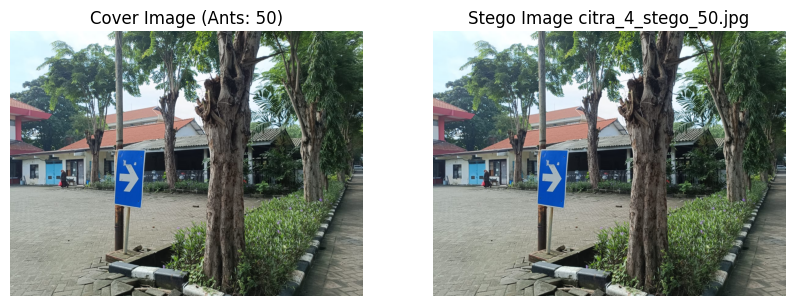

Evaluation Metrics for citra_4_stego_50.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.99
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 4.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:50<00:00,  1.11s/it]


Complex pixels: 54371
Ant Journeys (start_pos -> end_pos):
Ant 1: (194, 926) -> (196, 922)
Ant 2: (518, 862) -> (525, 861)
Ant 3: (605, 677) -> (599, 662)
Ant 4: (750, 743) -> (747, 726)
Ant 5: (867, 1060) -> (860, 1047)
Ant 6: (712, 1009) -> (701, 1014)
Ant 7: (376, 84) -> (369, 96)
Ant 8: (540, 788) -> (545, 791)
Ant 9: (859, 866) -> (855, 860)
Ant 10: (293, 576) -> (281, 570)
Ant 11: (767, 239) -> (765, 262)
Ant 12: (152, 676) -> (161, 685)
Ant 13: (663, 412) -> (663, 404)
Ant 14: (256, 39) -> (261, 32)
Ant 15: (603, 15) -> (605, 34)
Ant 16: (564, 933) -> (560, 925)
Ant 17: (781, 138) -> (768, 129)
Ant 18: (522, 1034) -> (517, 1048)
Ant 19: (122, 373) -> (118, 360)
Ant 20: (340, 1105) -> (329, 1092)
Ant 21: (747, 421) -> (746, 404)
Ant 22: (124, 164) -> (140, 156)
Ant 23: (118, 521) -> (115, 529)
Ant 24: (669, 265) -> (666, 260)
Ant 25: (541, 291) -> (542, 276)
Ant 26: (330, 616) -> (323, 631)
Ant 27: (577, 979) -> (578, 977)
Ant 28: (451, 82) -> (441, 86)
Ant 29: (380, 152) -> (378

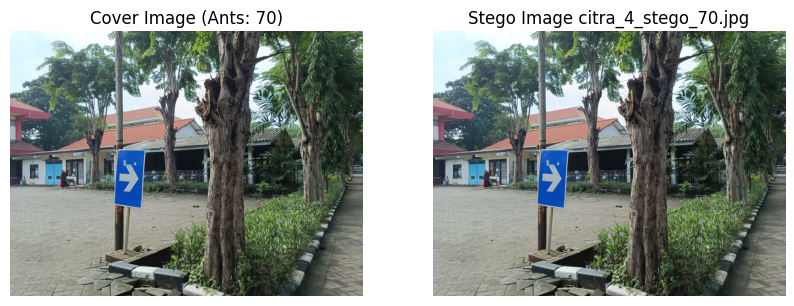

Evaluation Metrics for citra_4_stego_70.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.87
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 4.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:45<00:00,  1.65s/it]


Complex pixels: 69793
Ant Journeys (start_pos -> end_pos):
Ant 1: (540, 181) -> (538, 175)
Ant 2: (629, 769) -> (631, 758)
Ant 3: (825, 287) -> (825, 301)
Ant 4: (311, 695) -> (304, 690)
Ant 5: (86, 285) -> (79, 290)
Ant 6: (261, 550) -> (254, 539)
Ant 7: (695, 850) -> (684, 835)
Ant 8: (554, 374) -> (575, 368)
Ant 9: (245, 595) -> (240, 595)
Ant 10: (819, 326) -> (813, 315)
Ant 11: (110, 1048) -> (119, 1042)
Ant 12: (617, 188) -> (610, 193)
Ant 13: (489, 842) -> (480, 838)
Ant 14: (502, 256) -> (511, 268)
Ant 15: (80, 820) -> (87, 819)
Ant 16: (160, 65) -> (159, 66)
Ant 17: (636, 446) -> (642, 446)
Ant 18: (591, 235) -> (584, 234)
Ant 19: (791, 857) -> (795, 859)
Ant 20: (257, 448) -> (254, 439)
Ant 21: (80, 46) -> (73, 48)
Ant 22: (864, 370) -> (863, 382)
Ant 23: (725, 199) -> (722, 201)
Ant 24: (426, 1060) -> (424, 1043)
Ant 25: (352, 531) -> (349, 548)
Ant 26: (210, 1132) -> (210, 1123)
Ant 27: (189, 217) -> (202, 227)
Ant 28: (30, 5) -> (29, 12)
Ant 29: (603, 20) -> (591, 1)
Ant 3

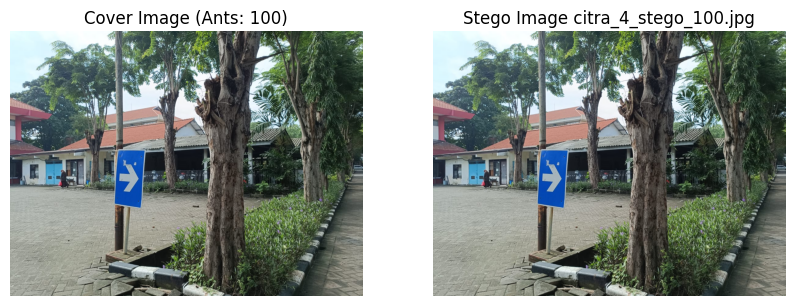

Evaluation Metrics for citra_4_stego_100.jpg:
Capacity       : 0.0002
PSNR (dB)      : 87.64
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0002
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 5.png with 10 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:18<00:00,  5.44it/s]


Complex pixels: 6659
Ant Journeys (start_pos -> end_pos):
Ant 1: (1413, 945) -> (1405, 949)
Ant 2: (948, 364) -> (952, 375)
Ant 3: (1126, 873) -> (1128, 879)
Ant 4: (1239, 868) -> (1227, 878)
Ant 5: (835, 983) -> (844, 983)
Ant 6: (198, 1073) -> (198, 1075)
Ant 7: (1467, 616) -> (1458, 615)
Ant 8: (320, 1002) -> (312, 989)
Ant 9: (898, 170) -> (898, 166)
Ant 10: (27, 38) -> (32, 50)
Stego image saved as: /content/citra_5_stego_10.jpg


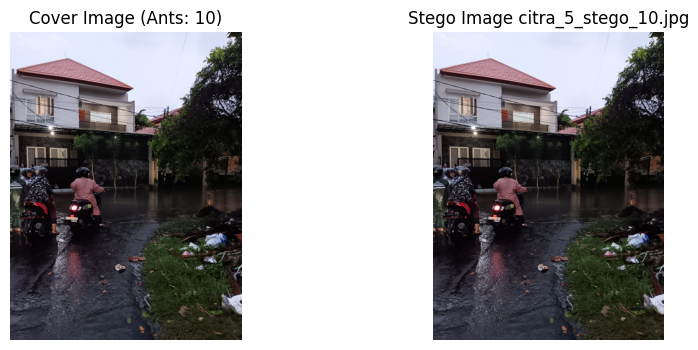

Evaluation Metrics for citra_5_stego_10.jpg:
Capacity       : 0.0001
PSNR (dB)      : 90.84
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0001
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 5.png with 30 ants ===


ACO Optimization: 100%|██████████| 100/100 [00:54<00:00,  1.82it/s]


Complex pixels: 19085
Ant Journeys (start_pos -> end_pos):
Ant 1: (1154, 381) -> (1143, 367)
Ant 2: (188, 913) -> (200, 921)
Ant 3: (227, 520) -> (233, 526)
Ant 4: (429, 1058) -> (429, 1053)
Ant 5: (664, 1088) -> (655, 1090)
Ant 6: (1051, 956) -> (1046, 952)
Ant 7: (731, 1046) -> (720, 1039)
Ant 8: (151, 792) -> (141, 796)
Ant 9: (1161, 97) -> (1156, 95)
Ant 10: (1123, 479) -> (1117, 469)
Ant 11: (1253, 1029) -> (1265, 1027)
Ant 12: (1500, 317) -> (1506, 312)
Ant 13: (1218, 1077) -> (1214, 1079)
Ant 14: (767, 733) -> (768, 741)
Ant 15: (74, 1177) -> (74, 1181)
Ant 16: (1068, 1) -> (1065, 19)
Ant 17: (225, 496) -> (226, 498)
Ant 18: (1283, 13) -> (1277, 3)
Ant 19: (1089, 4) -> (1101, 10)
Ant 20: (1351, 519) -> (1336, 527)
Ant 21: (129, 672) -> (137, 679)
Ant 22: (473, 813) -> (470, 813)
Ant 23: (1599, 632) -> (1598, 627)
Ant 24: (377, 73) -> (391, 78)
Ant 25: (825, 606) -> (827, 607)
Ant 26: (677, 152) -> (683, 149)
Ant 27: (14, 972) -> (20, 975)
Ant 28: (145, 482) -> (145, 475)
Ant 29:

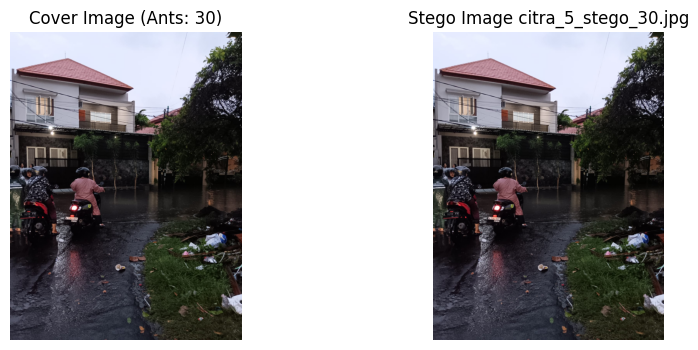

Evaluation Metrics for citra_5_stego_30.jpg:
Capacity       : 0.0001
PSNR (dB)      : 90.72
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0001
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 5.png with 50 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:19<00:00,  1.26it/s]


Complex pixels: 31405
Ant Journeys (start_pos -> end_pos):
Ant 1: (1501, 466) -> (1506, 466)
Ant 2: (355, 880) -> (366, 890)
Ant 3: (365, 983) -> (364, 974)
Ant 4: (55, 310) -> (55, 302)
Ant 5: (87, 15) -> (95, 23)
Ant 6: (1368, 282) -> (1375, 276)
Ant 7: (1308, 492) -> (1299, 476)
Ant 8: (44, 665) -> (39, 661)
Ant 9: (1364, 144) -> (1367, 146)
Ant 10: (885, 1145) -> (873, 1138)
Ant 11: (1058, 436) -> (1056, 432)
Ant 12: (882, 132) -> (882, 123)
Ant 13: (475, 460) -> (464, 456)
Ant 14: (655, 988) -> (660, 982)
Ant 15: (988, 959) -> (985, 963)
Ant 16: (1419, 714) -> (1413, 702)
Ant 17: (834, 965) -> (831, 966)
Ant 18: (48, 911) -> (48, 906)
Ant 19: (1517, 974) -> (1514, 975)
Ant 20: (834, 697) -> (822, 716)
Ant 21: (1247, 160) -> (1252, 156)
Ant 22: (233, 132) -> (232, 138)
Ant 23: (949, 38) -> (944, 18)
Ant 24: (691, 108) -> (684, 94)
Ant 25: (355, 150) -> (367, 159)
Ant 26: (1052, 275) -> (1058, 276)
Ant 27: (137, 510) -> (135, 498)
Ant 28: (1267, 584) -> (1266, 601)
Ant 29: (156, 759

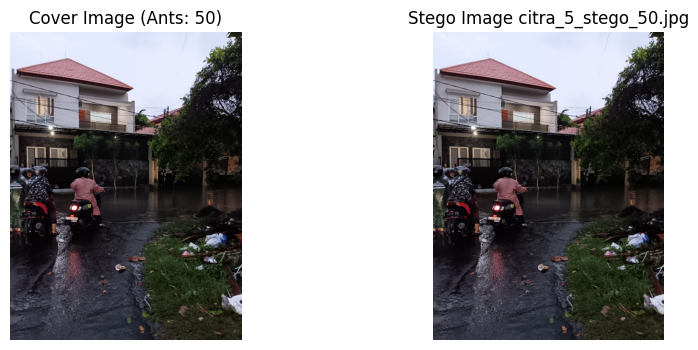

Evaluation Metrics for citra_5_stego_50.jpg:
Capacity       : 0.0001
PSNR (dB)      : 90.95
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0001
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 5.png with 70 ants ===


ACO Optimization: 100%|██████████| 100/100 [01:51<00:00,  1.12s/it]


Complex pixels: 43528
Ant Journeys (start_pos -> end_pos):
Ant 1: (839, 429) -> (846, 449)
Ant 2: (307, 735) -> (306, 747)
Ant 3: (109, 1086) -> (109, 1079)
Ant 4: (301, 795) -> (296, 797)
Ant 5: (922, 478) -> (923, 483)
Ant 6: (1479, 385) -> (1491, 375)
Ant 7: (60, 542) -> (64, 545)
Ant 8: (1167, 671) -> (1154, 668)
Ant 9: (1477, 487) -> (1480, 478)
Ant 10: (908, 254) -> (902, 257)
Ant 11: (1598, 377) -> (1599, 377)
Ant 12: (998, 650) -> (1010, 627)
Ant 13: (1368, 664) -> (1373, 688)
Ant 14: (866, 164) -> (848, 160)
Ant 15: (1442, 745) -> (1435, 746)
Ant 16: (571, 954) -> (575, 949)
Ant 17: (217, 422) -> (205, 433)
Ant 18: (1161, 759) -> (1158, 760)
Ant 19: (1517, 264) -> (1517, 260)
Ant 20: (619, 743) -> (617, 743)
Ant 21: (1089, 460) -> (1091, 469)
Ant 22: (140, 989) -> (143, 982)
Ant 23: (411, 651) -> (398, 641)
Ant 24: (554, 1112) -> (550, 1116)
Ant 25: (676, 518) -> (668, 529)
Ant 26: (1354, 1069) -> (1346, 1073)
Ant 27: (1036, 101) -> (1032, 101)
Ant 28: (1015, 806) -> (1006, 80

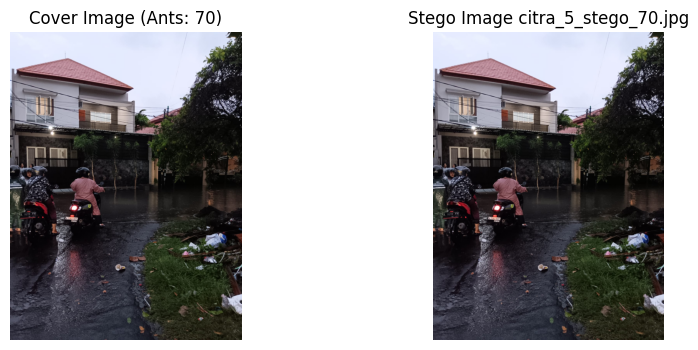

Evaluation Metrics for citra_5_stego_70.jpg:
Capacity       : 0.0001
PSNR (dB)      : 90.77
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0001
LPIPS          : 0.0000
Failed to decode extracted message

=== Testing /content/citra 5.png with 100 ants ===


ACO Optimization: 100%|██████████| 100/100 [02:35<00:00,  1.56s/it]


Complex pixels: 58766
Ant Journeys (start_pos -> end_pos):
Ant 1: (1438, 772) -> (1442, 773)
Ant 2: (566, 640) -> (569, 638)
Ant 3: (769, 443) -> (766, 439)
Ant 4: (184, 238) -> (191, 228)
Ant 5: (318, 1183) -> (336, 1192)
Ant 6: (501, 626) -> (515, 634)
Ant 7: (436, 1097) -> (446, 1112)
Ant 8: (1479, 1073) -> (1505, 1080)
Ant 9: (529, 372) -> (517, 362)
Ant 10: (59, 13) -> (55, 18)
Ant 11: (30, 148) -> (41, 135)
Ant 12: (453, 448) -> (453, 441)
Ant 13: (1458, 1059) -> (1456, 1054)
Ant 14: (313, 279) -> (309, 271)
Ant 15: (943, 1148) -> (948, 1133)
Ant 16: (352, 813) -> (342, 811)
Ant 17: (234, 12) -> (255, 12)
Ant 18: (1030, 0) -> (1019, 9)
Ant 19: (1200, 741) -> (1201, 754)
Ant 20: (216, 20) -> (224, 12)
Ant 21: (1562, 813) -> (1557, 800)
Ant 22: (681, 410) -> (678, 400)
Ant 23: (1060, 881) -> (1066, 874)
Ant 24: (871, 841) -> (868, 844)
Ant 25: (285, 581) -> (299, 571)
Ant 26: (1169, 325) -> (1170, 328)
Ant 27: (1266, 303) -> (1275, 298)
Ant 28: (745, 504) -> (746, 500)
Ant 29: (361

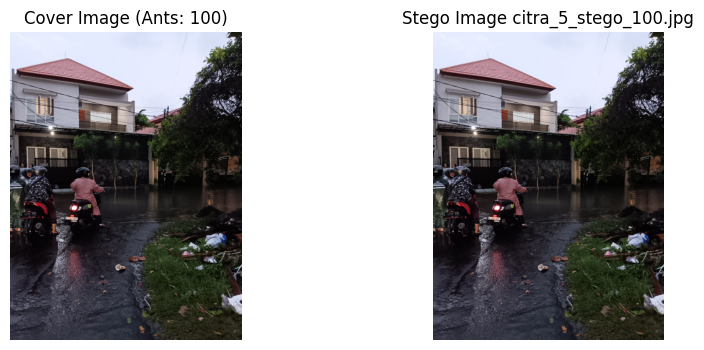

Evaluation Metrics for citra_5_stego_100.jpg:
Capacity       : 0.0001
PSNR (dB)      : 90.75
MSE            : 0.0001
NC             : 1.0000
BPP            : 0.0001
LPIPS          : 0.0000
Failed to decode extracted message

=== PSNR Summary for citra_1 ===
Image citra_1_stego_10.jpg: PSNR = 85.69 dB
Image citra_1_stego_30.jpg: PSNR = 85.44 dB
Image citra_1_stego_50.jpg: PSNR = 85.60 dB
Image citra_1_stego_70.jpg: PSNR = 85.95 dB
Image citra_1_stego_100.jpg: PSNR = 85.86 dB

=== PSNR Summary for citra_2 ===
Image citra_2_stego_10.jpg: PSNR = 99.13 dB
Image citra_2_stego_30.jpg: PSNR = 99.37 dB
Image citra_2_stego_50.jpg: PSNR = 98.91 dB
Image citra_2_stego_70.jpg: PSNR = 99.02 dB
Image citra_2_stego_100.jpg: PSNR = 99.03 dB

=== PSNR Summary for citra_3 ===
Image citra_3_stego_10.jpg: PSNR = 87.21 dB
Image citra_3_stego_30.jpg: PSNR = 87.25 dB
Image citra_3_stego_50.jpg: PSNR = 87.76 dB
Image citra_3_stego_70.jpg: PSNR = 87.44 dB
Image citra_3_stego_100.jpg: PSNR = 87.53 dB

=== PSNR S

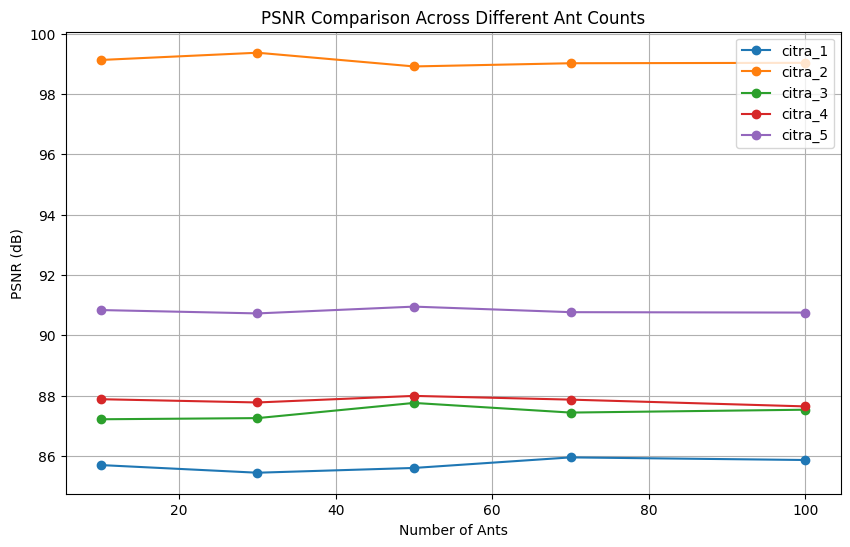

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import torch
import lpips
from google.colab import files

try:
    loss_fn = lpips.LPIPS(net='alex')
except Exception as e:
    print(f"Failed to initialize LPIPS model: {e}")
    exit(1)

ant_counts = [10, 30, 50, 70, 100]

def process_image(image_path, secret_message, ant_counts, loss_fn):
    base_name = os.path.splitext(os.path.basename(image_path))[0].replace(" ", "_")
    results = []

    if not os.path.exists(image_path):
        print(f"Error: Image file {image_path} not found.")
        print("Please upload the image to /content/ in Colab.")
        uploaded = files.upload()
        if os.path.basename(image_path) not in uploaded:
            print(f"Error: Please upload a file named '{os.path.basename(image_path)}'.")
            exit(1)

    cover_image = cv2.imread(image_path)
    if cover_image is None:
        print(f"Error: Failed to load image {image_path}. Check if the file is a valid image.")
        exit(1)
    cover_image = cv2.cvtColor(cover_image, cv2.COLOR_BGR2RGB)

    for ants in ant_counts:
        print(f"\n=== Testing {image_path} with {ants} ants ===")

        aco = ACOSteganography(ants=ants)
        try:
            complex_region, _ = aco.detect_complex_regions(cover_image)
            print(f"Complex pixels: {np.sum(complex_region)}")
            print("Ant Journeys (start_pos -> end_pos):")
            for i, (start, end) in enumerate(aco.ant_journeys):
                print(f"Ant {i+1}: {start} -> {end}")
        except Exception as e:
            print(f"Error in detecting complex regions: {e}")
            continue

        seed_key = f"secret_key_{ants}"
        try:
            stego_image, capacity = aco.embed_message(cover_image, secret_message, complex_region, seed_key=seed_key)
        except Exception as e:
            print(f"Error in embedding message: {e}")
            continue

        stego_image = stego_image.astype(np.uint8)

        # Menyimpan stego image
        stego_image_path = f"/content/{base_name}_stego_{ants}.jpg"
        cv2.imwrite(stego_image_path, cv2.cvtColor(stego_image, cv2.COLOR_RGB2BGR))
        print(f"Stego image saved as: {stego_image_path}")

        mse = np.mean((cover_image.astype("float32") - stego_image.astype("float32")) ** 2)
        psnr = 10 * np.log10(255**2 / mse) if mse != 0 else float('inf')
        nc = np.sum(cover_image * stego_image) / np.sqrt(np.sum(cover_image**2) * np.sum(stego_image**2))
        h, w, c = cover_image.shape
        total_pixels = h * w * c
        message_bits = len(secret_message) * 8
        bpp = message_bits / total_pixels if total_pixels > 0 else 0.0

        try:
            img0 = torch.tensor(cover_image / 255., dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
            img1 = torch.tensor(stego_image / 255., dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)
            lpips_score = loss_fn(img0, img1).item()
        except Exception as e:
            print(f"Error calculating LPIPS: {e}")
            lpips_score = float('nan')

        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.title(f"Cover Image (Ants: {ants})")
        plt.imshow(cover_image)
        plt.axis("off")
        plt.subplot(1, 2, 2)
        plt.title(f"Stego Image {os.path.basename(stego_image_path)}")
        plt.imshow(stego_image)
        plt.axis("off")
        plt.show()

        print(f"Evaluation Metrics for {os.path.basename(stego_image_path)}:")
        print(f"Capacity       : {capacity:.4f}")
        print(f"PSNR (dB)      : {psnr:.2f}")
        print(f"MSE            : {mse:.4f}")
        print(f"NC             : {nc:.4f}")
        print(f"BPP            : {bpp:.4f}")
        print(f"LPIPS          : {lpips_score:.4f}")

        # Extract message
        try:
            extracted = aco.extract_message(stego_image, complex_region, seed_key=seed_key)
            try:
                print(f"Extracted message: {extracted.decode()}")
            except:
                print("Failed to decode extracted message")
        except Exception as e:
            print(f"Error in extracting message: {e}")

        # Store results
        results.append({
            'ants': ants,
            'image_name': os.path.basename(stego_image_path),
            'psnr': psnr,
            'mse': mse,
            'nc': nc,
            'bpp': bpp,
            'lpips': lpips_score,
            'capacity': capacity
        })

    return base_name, results

image_paths = ['/content/citra 1.png','/content/citra 2.png', '/content/citra 3.png','/content/citra 4.png','/content/citra 5.png']  # Add more images as needed
secret_message = input("Masukkan pesan rahasia yang ingin disisipkan: ")
all_results = {}

for image_path in image_paths:
    base_name, results = process_image(image_path, secret_message, ant_counts, loss_fn)
    all_results[base_name] = results

for base_name, results in all_results.items():
    print(f"\n=== PSNR Summary for {base_name} ===")
    for result in results:
        print(f"Image {result['image_name']}: PSNR = {result['psnr']:.2f} dB")

plt.figure(figsize=(10, 6))
for base_name, results in all_results.items():
    ant_values = [result['ants'] for result in results]
    psnr_values = [result['psnr'] for result in results]
    plt.plot(ant_values, psnr_values, marker='o', label=f"{base_name}")

plt.title('PSNR Comparison Across Different Ant Counts')
plt.xlabel('Number of Ants')
plt.ylabel('PSNR (dB)')
plt.grid(True)
plt.legend()
plt.savefig('psnr_comparison.png')
plt.show()

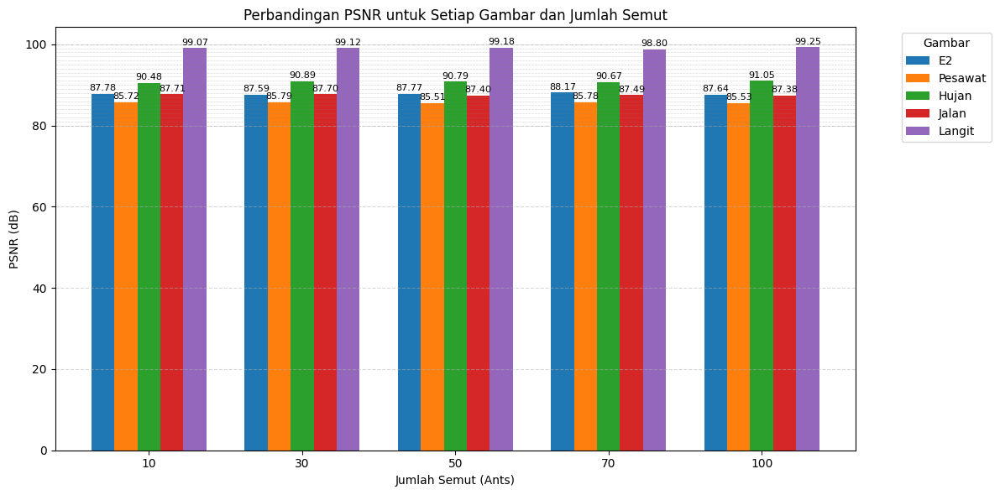

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

ant_values = ant_counts
image_names = list(all_results.keys())
n_images = len(image_names)
bar_width = 0.15
x = np.arange(len(ant_values))

plt.figure(figsize=(12, 6))

for i, image_name in enumerate(image_names):
    psnr_values = [result['psnr'] for result in all_results[image_name]]
    offset = (i - n_images / 2) * bar_width + bar_width / 2
    bars = plt.bar(x + offset, psnr_values, width=bar_width, label=image_name)

    # Keterangan nilai PSNR
    for j, bar in enumerate(bars):
        height = bar.get_height()
        if height > 80:
            plt.text(bar.get_x() + bar.get_width() / 2, height + 0.3,
                     f"{height:.2f}", ha='center', va='bottom', fontsize=8)

# Garis kecil
max_psnr = max(result['psnr'] for results in all_results.values() for result in results)
for y in np.arange(80, max_psnr + 1, 1):
    plt.axhline(y, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)

plt.xlabel('Jumlah Semut (Ants)')
plt.ylabel('PSNR (dB)')
plt.title('Perbandingan PSNR untuk Setiap Gambar dan Jumlah Semut')
plt.xticks(x, ant_values)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(title="Gambar", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


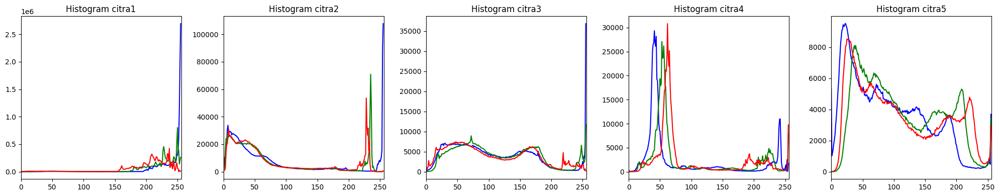

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
def show_histogram(image, title):
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr = cv2.calcHist([image],[i],None,[256],[0,256])
        plt.plot(histr,color = col)
        plt.xlim([0,256])
    plt.title(title)

image_E2 = cv2.imread("/content/drive/MyDrive/PENDIDIKAN/Pengolahan Citra Digital/PCD 2025/Dataset/Steganografi dan watermarking/citra1.png")
image_Pesawat = cv2.imread("/content/drive/MyDrive/PENDIDIKAN/Pengolahan Citra Digital/PCD 2025/Dataset/Steganografi dan watermarking/citra2.png")
image_Hujan = cv2.imread("/content/drive/MyDrive/PENDIDIKAN/Pengolahan Citra Digital/PCD 2025/Dataset/Steganografi dan watermarking/citra3.png")
image_Jalan = cv2.imread("/content/drive/MyDrive/PENDIDIKAN/Pengolahan Citra Digital/PCD 2025/Dataset/Steganografi dan watermarking/citra4.png")
image_Langit = cv2.imread("/content/drive/MyDrive/PENDIDIKAN/Pengolahan Citra Digital/PCD 2025/Dataset/Steganografi dan watermarking/citra5.png")

plt.figure(figsize=(20, 4))
plt.subplot(1, 5, 1)
show_histogram(image_Pesawat, "Histogram citra1")
plt.subplot(1, 5, 2)
show_histogram(image_Langit, "Histogram citra2")
plt.subplot(1, 5, 3)
show_histogram(image_Jalan, "Histogram citra3")
plt.subplot(1, 5, 4)
show_histogram(image_E2, "Histogram citra4")
plt.subplot(1, 5, 5)
show_histogram(image_Hujan, "Histogram citra5")

plt.tight_layout()
plt.show()